# Training Custom ResNet
___

## Table of contents
1. [Imports](#Imports)
2. [LoadData](#LoadData)
3. [Config](#Configs)
4. [Analysis](#Analysis)
5. [Process](#Process)

## Imports

In [1]:
import os
import numpy as np
import pandas as pd

import optuna
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from torch.utils.data import Dataset,DataLoader,random_split
from torch.utils.tensorboard import SummaryWriter
import torchvision
from torchvision import models, transforms
from torch_lr_finder import LRFinder

from tqdm.notebook import tqdm

import math
import pretrainedmodels as ptm
import h5py
import copy
from datetime import datetime
import matplotlib.pyplot as plt

In [2]:
from Library.datasets import DatasetH5TwoRandom, DatasetH5ForTest, compute_std_mean
from Library.transforms import RandomFlip,RandomOffset,RandomRotateGrayscale
from Library.scheduler import OneCycleLR,LogLR
from Library.cresnet import initialize_cresnet
from Library.dml import RefBasedDeepMetric
from Library.models.FeatureExtractor import FeatureExtractor, Block, CustomNet
from Library.trainers import RefBasedDeepMetricTrainer

In [3]:
from Library.util import (
    jupyter_wide_screen,
    strings_contain_words, 
    strings_contain_patterns, 
    add_unique_entry
)

jupyter_wide_screen()

## LoadData

#### To initialize dataset: obtain References and Dataset object

In [4]:
def init_dataset(path,seq_idx_list,mean_val,std_val):

    ds_h5 = []
    refs_list = []

    img_transforms = [RandomRotateGrayscale(rot_range=[-0.1, 0.1], fill=150),                       
                      RandomFlip(lr_prob=0.5, ud_prob=0.5),
                      transforms.ToTensor(),
                      transforms.Normalize((mean_val,),(std_val,))]
    
    composed_img_transforms = transforms.Compose(img_transforms)
    
    # to obtain the Seq data
    for seq_idx in seq_idx_list:
        h5_fpath = path.format(seq_idx)
        h5_f = DatasetH5TwoRandom(h5_fpath, num_ref = 32, transform = composed_img_transforms)
        
        # obtain the references, the first 32 images in every Seq.
        refs = h5_f.getRef()
        refs_list.append(refs)
        
        ds_h5.append(h5_f)

    return refs_list, ds_h5

In [5]:
def init_dataloaders(datasets,ds_ratio):
    dataloaders = []
    
    for ds in datasets:
        splitted_ds_num_data = [round(len(ds) * ds_ratio[i]) for i in range(len(ds_ratio))]
        splitted_ds_num_data[0] += len(ds) - int(np.sum(splitted_ds_num_data))

        splitted_ds = []

        for tmp_ds, batch_size, shuffle in zip(random_split(ds, splitted_ds_num_data), batch_sizes, shuffle_flags):

            splitted_ds.append(
                DataLoader(
                    tmp_ds,
                    batch_size=batch_size,
                    shuffle=shuffle,
                    drop_last=True,
                )
            )

        dataloaders.append(splitted_ds)
    return dataloaders


## Load Data
### Config

#### Load 3 Stripes Data from /22008_1000202026_652510007

In [6]:
data_path_type1 = "../MA/NewData/22008_1000202026_652510007"
fnames_type1 = "regenerated_roi_ms1_seq{}_720x30.h5" # 2,3,4
combined_path_type1 = os.path.join(data_path_type1, fnames_type1)
seq_idx_list_type1 = [4,6,7,8]

#### Load 1 Stripe Data from /21503_1000200411_653340003 If need

In [7]:
# type 2 Data New regenerated data
data_path_type2 = "../MA/NewData/21503_1000200411_653340003"
fnames_type2 = "regenerated_roi_ms1_seq{}_720x30.h5" # 2,3,5,6
combined_path_type2 = os.path.join(data_path_type2, fnames_type2)
seq_idx_list_type2 = [2,3,5,6]

In [8]:
inputs_shape = [1,720,30]
batch_sizes = [32, 32]
shuffle_flags = [True, False]
ds_ratio = [0.8, 0.2]

### Initialize datasets

In [9]:
# For 3 stripes data
mean_val = 0
std_val = 255
refs_list, ds_h5 = init_dataset(combined_path_type2, seq_idx_list_type2, mean_val, std_val)

In [10]:
len(refs_list)

4

In [ ]:
refs_list[0] = refs_list[2]
refs_list[1] = refs_list[2]

In [ ]:
refs_list[0][2] == refs_list[1][2]

### Initialize dataloaders

In [11]:
dataloaders = init_dataloaders(ds_h5, ds_ratio)
train_dls = [dls[0] for dls in dataloaders]
valid_dls = [dls[1] for dls in dataloaders]

In [12]:
ds_h5

In [13]:
len(refs_list)

4

In [14]:
refs_list[0].shape

torch.Size([32, 1, 720, 30])

In [15]:
print(len(ds_h5[0]))
print(len(ds_h5[1]))
print(len(ds_h5[2]))
print(len(ds_h5[3]))

8858
4747
7668
7958


## FeatureExtractor

In [16]:
class FeatureExtractor(nn.Module):
    # Custom feature extraction model from pretrained ResNet50

    def __init__(self, model,zero_init_residual=False):
        super(FeatureExtractor, self).__init__()
        
        self.conv1= nn.Conv2d(1, 64, 3, (2,1), 1)
        self.bn1 = model.bn1
        self.relu = nn.LeakyReLU()
        self.maxpool = model.maxpool

        self.layer1 = model.layer1
        self.layer2 = model.layer2

        self.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.fc = nn.Sequential(nn.Linear(512, 128),
                                nn.Linear(128, 64))
                                
                
        # weights initialization
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight, mode = 'fan_in', nonlinearity = 'leaky_relu')

        # Zero-initialize the last BN in each residual branch,
        # so that the residual branch starts with zeros, and each residual block behaves like an identity.
        # This improves the model by 0.2~0.3% according to https://arxiv.org/abs/1706.02677
        if zero_init_residual:
            for m in self.modules():
                if isinstance(m, Bottleneck):
                    nn.init.constant_(m.bn3.weight, 0)
                elif isinstance(m, BasicBlock):
                    nn.init.constant_(m.bn2.weight, 0)

    def forward(self, x):

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        
        self.featuremap0 = x.detach() # 核心代码

        x = self.layer1(x)
        self.featuremap1 = x.detach() # 核心代码
        
        x = self.layer2(x)
        self.featuremap2 = x.detach() # 核心代码
        
        x = self.avgpool(x)
        x = x.reshape(x.shape[0], -1)

        x = self.fc(x)
        self.featuremapfc = x.detach() # 核心代码
        
        # 使用的时候 : feature_output1 = model.featuremap1.transpose(1,0).cpu()
        
        return x
    
    def show_intermediate_shape(self, x):
        x = self.conv1(x)
        print("In conv1: ", x.shape)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        print("In maxpool: ", x.shape)
        x = self.layer1(x)
        print("In layer1: ", x.shape)
        x = self.layer2(x)
        print("In layer2: ", x.shape)
        
        x = self.avgpool(x)
        x = x.reshape(x.shape[0], -1)
        x = self.fc(x)
        print("In FC: ", x.shape)

## SiameseNet structure

In [ ]:
class SiameseNet(nn.Module):
    def __init__(self, model):
        super(SiameseNet, self).__init__()
        self.model = model
        
    def _calculate_loss(self, v1, v2, refs_tensor):
        r"""Calculate distance between vector of img1&img2 and each reference images

        Args:
            v1 (Tensor, torch.Size[batchsize,128]): batch of img1s from feature extractor
            v2 (Tensor, torch.Size[batchsize,128]): batch of img2s from feature extractor
            refs_vectors(List of Tensor, torch.Size([1,128])): List of 10 refs vectors
        """
        v_dim = v1.size(1)
        num_ref = refs_tensor.size(0)

        v11 = v1.unsqueeze(1).repeat(1, num_ref, 1)
        v22 = v2.unsqueeze(1).repeat(1, num_ref, 1)
        refs = refs_tensor.unsqueeze(0).repeat(v1.size(0), 1, 1)  #v1.size(0) = batch size

        kernel_matrix1 = (v11-refs).pow(2).sum(2) #torch.Size([batchsize, 10])
        kernel_matrix2 = (v22-refs).pow(2).sum(2) #torch.Size([batchsize, 10])

        v1_distance_mean = torch.mean(kernel_matrix1,dim = 1) #torch.Size([batchsize])
        v2_distance_mean = torch.mean(kernel_matrix2,dim = 1) #torch.Size([batchsize])
        
        diff = v1_distance_mean - v2_distance_mean
        
        #print("Before Sigmoid outputs",outputs)
        sigmoid = nn.Sigmoid()
        outputs = sigmoid(diff)
        #print("After Sigmoid outputs",outputs)

        return outputs

    def forward(self, x1, x2, refs):
        v1 = self.model(x1)
        v2 = self.model(x2)
        feature_refs = self.model(refs)
        
        outputs = self._calculate_loss(v1, v2, feature_refs)
        return outputs
    
    # This function used to plot the degradation metric , x1 is the sequential image
    def forward_test(self, x1, refs):
        v1 = self.model(x1)
        feature_refs = self.model(refs)
        
        return v1, feature_refs
    
    def get_model(self, x):
        return self.model(x)



#### Load pretrained ResNet

In [17]:
res_model = models.resnet50(pretrained=True)
feature_extractor = FeatureExtractor(res_model)
model = RefBasedDeepMetric(feature_extractor,loss_non_linearity_name='sigmoid',criterion_name='bce',)
#model = SiameseNet(feature_extractor)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(device)

RefBasedDeepMetric(
  (feature_extractor): FeatureExtractor(
    (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 1), padding=(1, 1))
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): LeakyReLU(negative_slope=0.01)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (down

In [ ]:
x = torch.randn(1,1,720,30)

model.model.show_intermediate_shape(x.to(device))

## Learning Rate Test

In [18]:
from torch.optim.lr_scheduler import _LRScheduler
from torch_lr_finder import LRFinder ,TrainDataLoaderIter, ValDataLoaderIter

In [19]:
class CustomTrainIter(TrainDataLoaderIter):
    def inputs_labels_from_batch(self, batch_data):
        img1, img2, labels = batch_data
        return img1, img2, labels
    
    def __next__(self):
        try:
            batch = next(self._iterator)
            img1, img2, labels = self.inputs_labels_from_batch(batch)
        except StopIteration:
            if not self.auto_reset:
                raise
            self._iterator = iter(self.data_loader)
            batch = next(self._iterator)
            img1, img2, labels = self.inputs_labels_from_batch(batch)

        return img1, img2, labels

In [20]:
class CustomValIter(ValDataLoaderIter):
    def inputs_labels_from_batch(self, batch_data):
        img1, img2, labels = batch_data
        return img1, img2, labels

In [21]:
class LinearLR(_LRScheduler):
    """Linearly increases the learning rate between two boundaries over a number of
    iterations.

    Arguments:
        optimizer (torch.optim.Optimizer): wrapped optimizer.
        end_lr (float): the final learning rate.
        num_iter (int): the number of iterations over which the test occurs.
        last_epoch (int, optional): the index of last epoch. Default: -1.
    """

    def __init__(self, optimizer, end_lr, num_iter, last_epoch=-1):
        self.end_lr = end_lr

        if num_iter <= 1:
            raise ValueError("`num_iter` must be larger than 1")
        self.num_iter = num_iter

        super(LinearLR, self).__init__(optimizer, last_epoch)

    def get_lr(self):
        r = self.last_epoch / (self.num_iter - 1)

        return [base_lr + r * (self.end_lr - base_lr) for base_lr in self.base_lrs]

In [22]:
class ExponentialLR(_LRScheduler):
    """Exponentially increases the learning rate between two boundaries over a number of
    iterations.

    Arguments:
        optimizer (torch.optim.Optimizer): wrapped optimizer.
        end_lr (float): the final learning rate.
        num_iter (int): the number of iterations over which the test occurs.
        last_epoch (int, optional): the index of last epoch. Default: -1.
    """

    def __init__(self, optimizer, end_lr, num_iter, last_epoch=-1):
        self.end_lr = end_lr

        if num_iter <= 1:
            raise ValueError("`num_iter` must be larger than 1")
        self.num_iter = num_iter

        super(ExponentialLR, self).__init__(optimizer, last_epoch)

    def get_lr(self):
        # In earlier Pytorch versions last_epoch starts at -1, while in recent versions
        # it starts at 0. We need to adjust the math a bit to handle this. See
        # discussion at: https://github.com/davidtvs/pytorch-lr-finder/pull/42
        
        r = self.last_epoch / (self.num_iter - 1)

        return [base_lr * (self.end_lr / base_lr) ** r for base_lr in self.base_lrs]

In [23]:
try:
    from apex import amp

    IS_AMP_AVAILABLE = True
except ImportError:
    IS_AMP_AVAILABLE = False
    
class CustomLRFinder(LRFinder):
    
    def custom_range_test(
        self,
        train_loader,
        curr_refs,
        val_loader=None,
        start_lr=None,
        end_lr=10,
        num_iter=100,
        step_mode="exp",
        smooth_f=0.05,
        diverge_th=5,
        accumulation_steps=1,
        non_blocking_transfer=True,
    ):
       
        # Reset test results
        self.history = {"lr": [], "loss": []}
        self.best_loss = None

        # Move the model to the proper device
        self.model.to(self.device)

        # Check if the optimizer is already attached to a scheduler
        self._check_for_scheduler()

        # Set the starting learning rate
        if start_lr:
            self._set_learning_rate(start_lr)

        # Initialize the proper learning rate policy
        if step_mode.lower() == "exp":
            lr_schedule = ExponentialLR(self.optimizer, end_lr, num_iter)
        elif step_mode.lower() == "linear":
            lr_schedule = LinearLR(self.optimizer, end_lr, num_iter)
        else:
            raise ValueError("expected one of (exp, linear), got {}".format(step_mode))

        if smooth_f < 0 or smooth_f >= 1:
            raise ValueError("smooth_f is outside the range [0, 1[")

        # Create an iterator to get data batch by batch
        if isinstance(train_loader, DataLoader):
            train_iter = TrainDataLoaderIter(train_loader)
        elif isinstance(train_loader, TrainDataLoaderIter):
            train_iter = train_loader
        else:
            raise ValueError(
                "`train_loader` has unsupported type: {}."
                "Expected types are `torch.utils.data.DataLoader`"
                "or child of `TrainDataLoaderIter`.".format(type(train_loader))
            )

        if val_loader:
            if isinstance(val_loader, DataLoader):
                val_iter = CustomValIter(val_loader)
            elif isinstance(val_loader, ValDataLoaderIter):
                val_iter = val_loader
            else:
                raise ValueError(
                    "`val_loader` has unsupported type: {}."
                    "Expected types are `torch.utils.data.DataLoader`"
                    "or child of `ValDataLoaderIter`.".format(type(val_loader))
                )

        for iteration in tqdm(range(num_iter)):
            # Train on batch and retrieve loss
            loss = self._train_batch(
                train_iter,
                curr_refs,
                accumulation_steps,
                non_blocking_transfer= non_blocking_transfer,
            )
            if val_loader:
                loss = self._validate(
                    val_iter, curr_refs, non_blocking_transfer=non_blocking_transfer
                )

            # Update the learning rate
            self.history["lr"].append(lr_schedule.get_lr()[0])
            lr_schedule.step()

            # Track the best loss and smooth it if smooth_f is specified
            if iteration == 0:
                self.best_loss = loss
            else:
                if smooth_f > 0:
                    loss = smooth_f * loss + (1 - smooth_f) * self.history["loss"][-1]
                if loss < self.best_loss:
                    self.best_loss = loss

            # Check if the loss has diverged; if it has, stop the test
            self.history["loss"].append(loss)
            if loss > diverge_th * self.best_loss:
                print("Stopping early, the loss has diverged")
                break

        print("Learning rate search finished. See the graph with {finder_name}.plot()")

    def _train_batch(self, train_iter, curr_refs, accumulation_steps, non_blocking_transfer=True):
        self.model.train()
        total_loss = None  # for late initialization
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self.optimizer.zero_grad()
        curr_refs = curr_refs.float().to(device)

        for i in range(accumulation_steps):
            img1, img2, labels = next(train_iter)
            labels = labels.view(-1)
            labels = labels.to(device)
            img1 = img1.float().to(device)
            img2 = img2.float().to(device)

            # Forward pass
            loss, preds = self.model.compute_loss(img1, img2, curr_refs, labels)

            # Loss should be averaged in each step
            loss /= accumulation_steps

            # Backward pass
            if IS_AMP_AVAILABLE and hasattr(self.optimizer, "_amp_stash"):
                # For minor performance optimization, see also:
                # https://nvidia.github.io/apex/advanced.html#gradient-accumulation-across-iterations
                delay_unscale = ((i + 1) % accumulation_steps) != 0

                with amp.scale_loss(
                    loss, self.optimizer, delay_unscale=delay_unscale
                ) as scaled_loss:
                    scaled_loss.backward()
            else:
                loss.backward()

            if total_loss is None:
                total_loss = loss
            else:
                total_loss += loss

        self.optimizer.step()

        return total_loss.item()
    
    def _validate(self, val_iter, curr_refs, non_blocking_transfer=True):
        # Set model to evaluation mode and disable gradient computation
        running_loss = 0
        self.model.eval()
        
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        curr_refs = curr_refs.float().to(device)
        with torch.no_grad():
            for img1, img2, labels in val_iter:
                # Move data to the correct device
                labels = labels.view(-1)
                labels = labels.to(device)
                img1 = img1.float().to(device)
                img2 = img2.float().to(device)

                # Forward pass and loss computation
                loss, preds = self.model.compute_loss(img1, img2, curr_refs, labels)
                running_loss += loss.item() * len(labels)

        return running_loss / len(val_iter.dataset)
    

### LR Test Config

In [24]:
start_lr = 1e-8

min_lr_factor = 1e-1
anneal_lr_factor= 1e-1

train_dl_idx = 0
valid_dl_idx = 1
test_dl_idx = 2
refs_dl_idx = 0

optimizer = torch.optim.Adam(model.parameters(),lr=start_lr, eps=1e-08, weight_decay=0)
#optimizer = torch.optim.SGD(filter(lambda p: p.requires_grad, model.parameters()), lr=lr, momentum=0.5)
#criterion = nn.CrossEntropyLoss()
#criterion = nn.BCEWithLogitsLoss(reduction = 'none')
criterion = nn.BCELoss()


Learning rate search finished. See the graph with {finder_name}.plot()


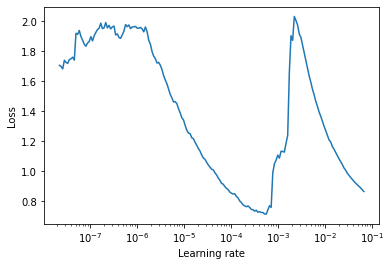

In [25]:
#lr_finder.reset()
lr_finder = CustomLRFinder(model, optimizer, criterion, device="cuda")

# seq dataloader / shuffel the dataloader
for refs, train_dl, val_dl in zip (refs_list, train_dls, valid_dls):
    custom_train_iter = CustomTrainIter(train_dl)
    custom_val_iter = CustomValIter(val_dl)
lr_finder.custom_range_test(custom_train_iter, curr_refs = refs, end_lr=0.1, num_iter=200)
lr_finder.plot(suggest_lr = False)
lr_finder.reset()

## To see the intmediate feature

In [ ]:
feature_output1 = model.model.featuremap1.transpose(1,0).cpu()
feature_output2 = model.model.featuremap2.transpose(1,0).cpu()
#feature_output3 = model.model.featuremap3.transpose(1,0).cpu()
#feature_output4 = model.model.featuremap4.transpose(1,0).cpu()
#feature_output_fc = model.model.featuremapfc.transpose(1,0).cpu()
feature_output2.shape

In [ ]:
def feature_imshow(inp, title=None):
    
    """Imshow for Tensor."""
    
    inp = inp.detach().numpy().transpose((1, 2, 0))
    
    mean = np.array([0.5, 0.5, 0.5])
    
    std = np.array([0.5, 0.5, 0.5])
    
    inp = std * inp + mean
    
    inp = np.clip(inp, 0, 1)
    
    plt.imshow(inp)
    
    if title is not None:
        plt.title(title)
    
    plt.pause(0.001)  # pause a bit so that plots are updated

In [ ]:
out = torchvision.utils.make_grid(feature_output1)
#feature_imshow(out)


## Training Config

In [26]:
num_epochs = 50

lr = 2e-05
min_lr_factor = 0.1
phases_ratio = [0.3, 0.2, 0.3, 0.2]

train_dl_idx = 0
valid_dl_idx = 1
test_dl_idx = 2

run_train = True

net_path = "../MA/save_net/"
criterion = nn.BCELoss()
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']
    
dateTimeObj = datetime.now()
timestampStr = dateTimeObj.strftime("%d-%b-%Y (%H:%M:%S)")
print('Current Timestamp : ', timestampStr)

Current Timestamp :  18-May-2021 (23:13:30)


### Train

Total Train Iterations:  658
Total Train Iterations List:  [180, 298, 478, 658]
[60, 39, 60, 60]


Train



Sequence:1, Seq Training Mean Loss: 0.9719613985882865, Seq Training Acc: 0.5213541666666667
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.49500196476777397, Seq Training Acc: 0.35104166666666664
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.7487634400526683, Seq Training Acc: 0.5784722222222223
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.6665058823095428, Seq Training Acc: 0.6284722222222222
******************************************************************
Epoch:1, Epoch Training Loss Mean: 0.788452684879303, Epoch Acc: 0.693113425925926
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.9450036346912384, Seq Val Acc: 0.5411458333333333



******************************************************************
Sequence:2, Seq Mean Loss: 0.8554145296414694, Seq Val Acc: 0.5504807692307693



******************************************************************
Sequence:3, Seq Mean Loss: 0.7907677561044693, Seq Val Acc: 0.5739583333333333



******************************************************************
Sequence:4, Seq Mean Loss: 0.5338614284992218, Seq Val Acc: 0.715625
Epoch:1, Epoch Val Mean Loss: 0.7741513252258301, Epoch Val Acc: 0.7295138888888889
******************************************************************


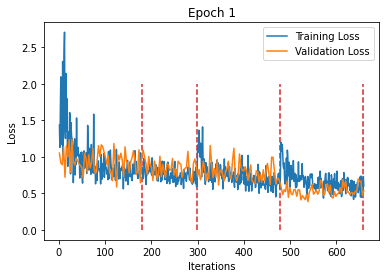

Train



Sequence:1, Seq Training Mean Loss: 0.7132586628198624, Seq Training Acc: 0.5532986111111111
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.44167119032806823, Seq Training Acc: 0.3848958333333333
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.6272144392132759, Seq Training Acc: 0.6489583333333333
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.5110254454943869, Seq Training Acc: 0.7463541666666667
******************************************************************
Epoch:2, Epoch Training Loss Mean: 0.6273108720779419, Epoch Acc: 0.7778356481481481
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.2296256959438323, Seq Val Acc: 0.540625



******************************************************************
Sequence:2, Seq Mean Loss: 1.0830735105734606, Seq Val Acc: 0.5272435897435898



******************************************************************
Sequence:3, Seq Mean Loss: 0.7050624360640844, Seq Val Acc: 0.6114583333333333



******************************************************************
Sequence:4, Seq Mean Loss: 0.4191692921022574, Seq Val Acc: 0.809375
Epoch:2, Epoch Val Mean Loss: 0.8377684950828552, Epoch Val Acc: 0.7680555555555556
******************************************************************


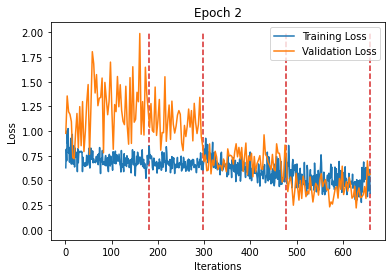

Train



Sequence:1, Seq Training Mean Loss: 0.6734024451838599, Seq Training Acc: 0.5960069444444445
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.41530132790406543, Seq Training Acc: 0.42586805555555557
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.582598466012213, Seq Training Acc: 0.6901041666666666
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.4339956654442681, Seq Training Acc: 0.7935763888888889
******************************************************************
Epoch:3, Epoch Training Loss Mean: 0.5759173631668091, Epoch Acc: 0.8351851851851851
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.3812504301468531, Seq Val Acc: 0.5703125



******************************************************************
Sequence:2, Seq Mean Loss: 1.307735568437821, Seq Val Acc: 0.563301282051282



******************************************************************
Sequence:3, Seq Mean Loss: 0.7735036204258601, Seq Val Acc: 0.6229166666666667



******************************************************************
Sequence:4, Seq Mean Loss: 0.37237357000509896, Seq Val Acc: 0.8432291666666667
Epoch:3, Epoch Val Mean Loss: 0.9252480864524841, Epoch Val Acc: 0.8008680555555555
******************************************************************


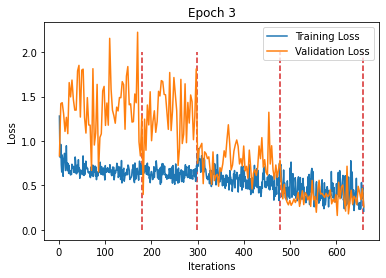

Train



Sequence:1, Seq Training Mean Loss: 0.6166457277205255, Seq Training Acc: 0.6604166666666667
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.40110442770851984, Seq Training Acc: 0.4388888888888889
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.5438470933172438, Seq Training Acc: 0.7180555555555556
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.39050024011068873, Seq Training Acc: 0.8256944444444444
******************************************************************
Epoch:4, Epoch Training Loss Mean: 0.5340084433555603, Epoch Acc: 0.8810185185185185
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.404355705777804, Seq Val Acc: 0.5838541666666667



******************************************************************
Sequence:2, Seq Mean Loss: 1.3315705122091832, Seq Val Acc: 0.6209935897435898



******************************************************************
Sequence:3, Seq Mean Loss: 0.8177937477827072, Seq Val Acc: 0.6411458333333333



******************************************************************
Sequence:4, Seq Mean Loss: 0.4051051060358683, Seq Val Acc: 0.8208333333333333
Epoch:4, Epoch Val Mean Loss: 0.9569247961044312, Epoch Val Acc: 0.8164930555555555
******************************************************************


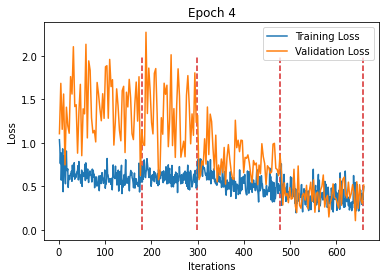

Train



Sequence:1, Seq Training Mean Loss: 0.593846415148841, Seq Training Acc: 0.6927083333333334
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3764604498942693, Seq Training Acc: 0.45694444444444443
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.513753614326318, Seq Training Acc: 0.7423611111111111
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.36947455919451183, Seq Training Acc: 0.8361111111111111
******************************************************************
Epoch:5, Epoch Training Loss Mean: 0.5070460438728333, Epoch Acc: 0.909375
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.7092854390541712, Seq Val Acc: 0.5927083333333333



******************************************************************
Sequence:2, Seq Mean Loss: 1.6807837700232482, Seq Val Acc: 0.5777243589743589



******************************************************************
Sequence:3, Seq Mean Loss: 0.7198379710316658, Seq Val Acc: 0.6604166666666667



******************************************************************
Sequence:4, Seq Mean Loss: 0.34161195494234564, Seq Val Acc: 0.8369791666666667
Epoch:5, Epoch Val Mean Loss: 1.0584231615066528, Epoch Val Acc: 0.821875
******************************************************************


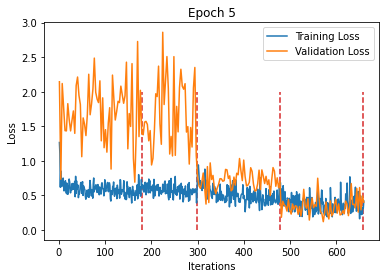

Train



Sequence:1, Seq Training Mean Loss: 0.5628036942746905, Seq Training Acc: 0.7109375
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3721181281738811, Seq Training Acc: 0.4640625
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4909822748767005, Seq Training Acc: 0.7598958333333333
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.3645703951517741, Seq Training Acc: 0.834375
******************************************************************
Epoch:6, Epoch Training Loss Mean: 0.489795446395874, Epoch Acc: 0.9230902777777777
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.50631187359492, Seq Val Acc: 0.6



******************************************************************
Sequence:2, Seq Mean Loss: 1.5049334183717384, Seq Val Acc: 0.6330128205128205



******************************************************************
Sequence:3, Seq Mean Loss: 0.9249231681227684, Seq Val Acc: 0.6505208333333333



******************************************************************
Sequence:4, Seq Mean Loss: 0.3438586495816708, Seq Val Acc: 0.8515625
Epoch:6, Epoch Val Mean Loss: 1.028301477432251, Epoch Val Acc: 0.8378472222222222
******************************************************************


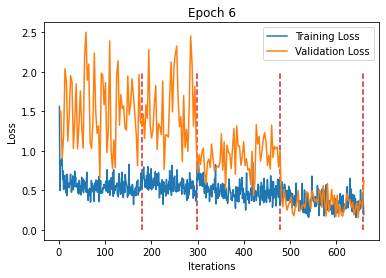

Train



Sequence:1, Seq Training Mean Loss: 0.532123584051927, Seq Training Acc: 0.7440972222222222
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3483119242721134, Seq Training Acc: 0.47725694444444444
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4803719728357262, Seq Training Acc: 0.7649305555555556
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.37206583147247635, Seq Training Acc: 0.8331597222222222
******************************************************************
Epoch:7, Epoch Training Loss Mean: 0.474038302898407, Epoch Acc: 0.9398148148148148
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.3806394353508948, Seq Val Acc: 0.6317708333333333



******************************************************************
Sequence:2, Seq Mean Loss: 1.4951696946070745, Seq Val Acc: 0.6330128205128205



******************************************************************
Sequence:3, Seq Mean Loss: 0.7357872769236564, Seq Val Acc: 0.6880208333333333



******************************************************************
Sequence:4, Seq Mean Loss: 0.3416825897991657, Seq Val Acc: 0.8447916666666667
Epoch:7, Epoch Val Mean Loss: 0.939717710018158, Epoch Val Acc: 0.8586805555555556
******************************************************************


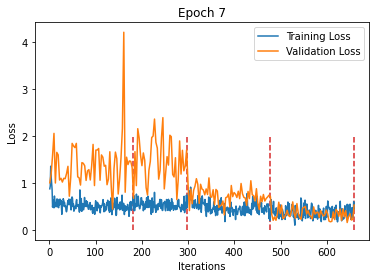

Train



Sequence:1, Seq Training Mean Loss: 0.5008432585332129, Seq Training Acc: 0.7605902777777778
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3346273968617121, Seq Training Acc: 0.4939236111111111
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4665766128235393, Seq Training Acc: 0.7802083333333333
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.3634813651442528, Seq Training Acc: 0.8375
******************************************************************
Epoch:8, Epoch Training Loss Mean: 0.455615758895874, Epoch Acc: 0.9574074074074074
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.670639905333519, Seq Val Acc: 0.6057291666666667



******************************************************************
Sequence:2, Seq Mean Loss: 1.741235986734048, Seq Val Acc: 0.5897435897435898



******************************************************************
Sequence:3, Seq Mean Loss: 0.7378446877002716, Seq Val Acc: 0.6859375



******************************************************************
Sequence:4, Seq Mean Loss: 0.2968878474086523, Seq Val Acc: 0.8708333333333333
Epoch:8, Epoch Val Mean Loss: 1.0512809753417969, Epoch Val Acc: 0.8486111111111111
******************************************************************


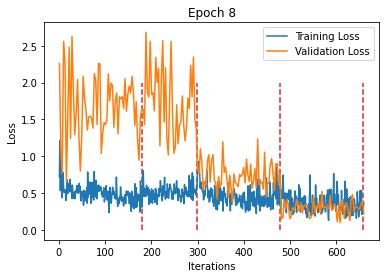

Train



Sequence:1, Seq Training Mean Loss: 0.4935920233527819, Seq Training Acc: 0.7678819444444445
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.32406938498218857, Seq Training Acc: 0.4956597222222222
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4636029286517037, Seq Training Acc: 0.7779513888888889
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.34378337350984417, Seq Training Acc: 0.85
******************************************************************
Epoch:9, Epoch Training Loss Mean: 0.44454196095466614, Epoch Acc: 0.9638310185185185
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.379160688817501, Seq Val Acc: 0.6380208333333334



******************************************************************
Sequence:2, Seq Mean Loss: 1.6076666177847447, Seq Val Acc: 0.6346153846153846



******************************************************************
Sequence:3, Seq Mean Loss: 0.8224695379535357, Seq Val Acc: 0.6578125



******************************************************************
Sequence:4, Seq Mean Loss: 0.3421894970039527, Seq Val Acc: 0.8526041666666667
Epoch:9, Epoch Val Mean Loss: 0.983233630657196, Epoch Val Acc: 0.8536458333333333
******************************************************************


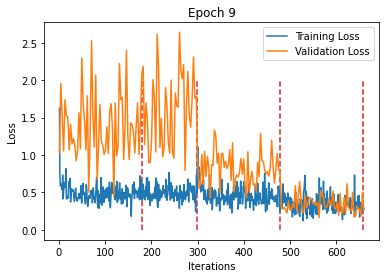

Train



Sequence:1, Seq Training Mean Loss: 0.46937146079209113, Seq Training Acc: 0.7814236111111111
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3076604425907135, Seq Training Acc: 0.5074652777777777
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4329102458225356, Seq Training Acc: 0.7973958333333333
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.3220907801555263, Seq Training Acc: 0.8585069444444444
******************************************************************
Epoch:10, Epoch Training Loss Mean: 0.4190971553325653, Epoch Acc: 0.9815972222222222
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.6440604050954184, Seq Val Acc: 0.634375



******************************************************************
Sequence:2, Seq Mean Loss: 1.7599600339547181, Seq Val Acc: 0.6282051282051282



******************************************************************
Sequence:3, Seq Mean Loss: 0.7283431544899941, Seq Val Acc: 0.6973958333333333



******************************************************************
Sequence:4, Seq Mean Loss: 0.31273418391744295, Seq Val Acc: 0.8619791666666666
Epoch:10, Epoch Val Mean Loss: 1.0490716695785522, Epoch Val Acc: 0.8673611111111111
******************************************************************


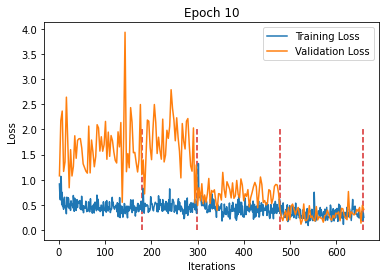

Train



Sequence:1, Seq Training Mean Loss: 0.4639328872164091, Seq Training Acc: 0.7842013888888889
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.31538786523871953, Seq Training Acc: 0.5052083333333334
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4331061479118135, Seq Training Acc: 0.7951388888888888
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.31948408914936915, Seq Training Acc: 0.8581597222222223
******************************************************************
Epoch:11, Epoch Training Loss Mean: 0.4190637767314911, Epoch Acc: 0.9809027777777778
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.2357390622297924, Seq Val Acc: 0.6640625



******************************************************************
Sequence:2, Seq Mean Loss: 1.8712815581223903, Seq Val Acc: 0.6370192307692307



******************************************************************
Sequence:3, Seq Mean Loss: 0.8040271734197935, Seq Val Acc: 0.7135416666666666



******************************************************************
Sequence:4, Seq Mean Loss: 0.3184303782880306, Seq Val Acc: 0.8734375
Epoch:11, Epoch Val Mean Loss: 0.9793232083320618, Epoch Val Acc: 0.8883680555555555
******************************************************************


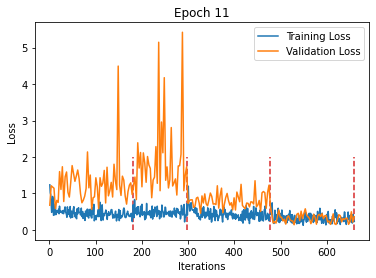

Train



Sequence:1, Seq Training Mean Loss: 0.4393093442751302, Seq Training Acc: 0.8008680555555555
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3150059603154659, Seq Training Acc: 0.5086805555555556
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.40405612174007627, Seq Training Acc: 0.80625
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.3391063326348861, Seq Training Acc: 0.8541666666666666
******************************************************************
Epoch:12, Epoch Training Loss Mean: 0.40964436531066895, Epoch Acc: 0.989988425925926
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.3225179105997085, Seq Val Acc: 0.6583333333333333



******************************************************************
Sequence:2, Seq Mean Loss: 1.5751328391906543, Seq Val Acc: 0.6362179487179487



******************************************************************
Sequence:3, Seq Mean Loss: 0.6172934785485268, Seq Val Acc: 0.7307291666666667



******************************************************************
Sequence:4, Seq Mean Loss: 0.2847729749977589, Seq Val Acc: 0.8703125
Epoch:12, Epoch Val Mean Loss: 0.889978289604187, Epoch Val Acc: 0.8909722222222223
******************************************************************


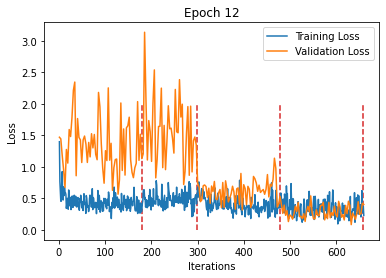

Train



Sequence:1, Seq Training Mean Loss: 0.4263837811847528, Seq Training Acc: 0.8043402777777777
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3078724480337567, Seq Training Acc: 0.5034722222222222
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.40764939387639365, Seq Training Acc: 0.8105902777777778
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2983710524522596, Seq Training Acc: 0.8699652777777778
******************************************************************
Epoch:13, Epoch Training Loss Mean: 0.3939966857433319, Epoch Acc: 0.9961226851851852
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.484124489625295, Seq Val Acc: 0.6588541666666666



******************************************************************
Sequence:2, Seq Mean Loss: 2.2068577240674925, Seq Val Acc: 0.6097756410256411



******************************************************************
Sequence:3, Seq Mean Loss: 0.6598595162232717, Seq Val Acc: 0.7442708333333333



******************************************************************
Sequence:4, Seq Mean Loss: 0.3115308303385973, Seq Val Acc: 0.8791666666666667
Epoch:13, Epoch Val Mean Loss: 1.0657458305358887, Epoch Val Acc: 0.8928819444444445
******************************************************************


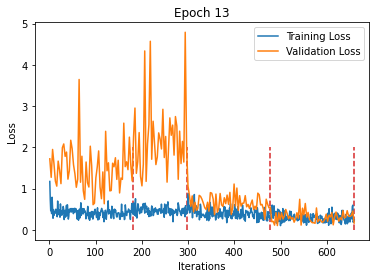

Train



Sequence:1, Seq Training Mean Loss: 0.448833712687095, Seq Training Acc: 0.7956597222222223
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2978527640302976, Seq Training Acc: 0.5133680555555555
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.41294571575191286, Seq Training Acc: 0.8052083333333333
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.31081477341552577, Seq Training Acc: 0.8631944444444445
******************************************************************
Epoch:14, Epoch Training Loss Mean: 0.40224987268447876, Epoch Acc: 0.9924768518518519
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.7262010375658672, Seq Val Acc: 0.6609375



******************************************************************
Sequence:2, Seq Mean Loss: 1.8888534819468474, Seq Val Acc: 0.6073717948717948



******************************************************************
Sequence:3, Seq Mean Loss: 0.45840668653448424, Seq Val Acc: 0.7880208333333333



******************************************************************
Sequence:4, Seq Mean Loss: 0.30083658223350845, Seq Val Acc: 0.8760416666666667
Epoch:14, Epoch Val Mean Loss: 1.0173147916793823, Epoch Val Acc: 0.9065972222222223
******************************************************************


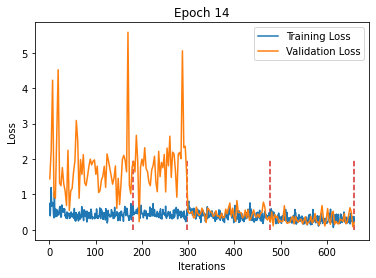

Train



Sequence:1, Seq Training Mean Loss: 0.430237805760569, Seq Training Acc: 0.8050347222222223
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.28417947532402144, Seq Training Acc: 0.5239583333333333
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4005150322284963, Seq Training Acc: 0.8138888888888889
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.310112855459253, Seq Training Acc: 0.8642361111111111
******************************************************************
Epoch:15, Epoch Training Loss Mean: 0.38982996344566345, Epoch Acc: 1.002372685185185
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.8638892402251561, Seq Val Acc: 0.6307291666666667



******************************************************************
Sequence:2, Seq Mean Loss: 2.3039175149721975, Seq Val Acc: 0.6129807692307693



******************************************************************
Sequence:3, Seq Mean Loss: 0.4526253099242846, Seq Val Acc: 0.7911458333333333



******************************************************************
Sequence:4, Seq Mean Loss: 0.26716917877395946, Seq Val Acc: 0.8828125
Epoch:15, Epoch Val Mean Loss: 1.118145227432251, Epoch Val Acc: 0.9010416666666666
******************************************************************


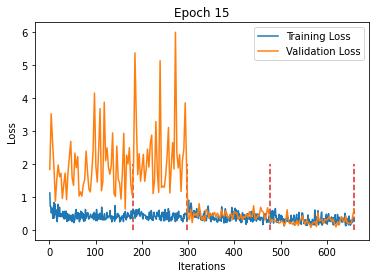

Train



Sequence:1, Seq Training Mean Loss: 0.4222520600590441, Seq Training Acc: 0.8105902777777778
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2826876221431626, Seq Training Acc: 0.5229166666666667
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4006894918779532, Seq Training Acc: 0.8109375
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.311097651720047, Seq Training Acc: 0.8635416666666667
******************************************************************
Epoch:16, Epoch Training Loss Mean: 0.38755446672439575, Epoch Acc: 1.002662037037037
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.9941020141045251, Seq Val Acc: 0.6442708333333333



******************************************************************
Sequence:2, Seq Mean Loss: 1.7530611936862652, Seq Val Acc: 0.6298076923076923



******************************************************************
Sequence:3, Seq Mean Loss: 0.5113856549064318, Seq Val Acc: 0.7697916666666667



******************************************************************
Sequence:4, Seq Mean Loss: 0.27682721509287755, Seq Val Acc: 0.878125
Epoch:16, Epoch Val Mean Loss: 1.0744670629501343, Epoch Val Acc: 0.9005208333333333
******************************************************************


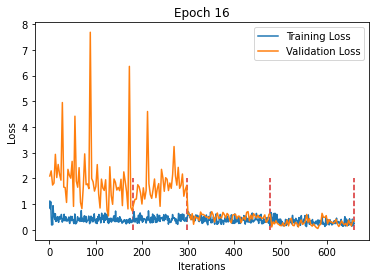

Train



Sequence:1, Seq Training Mean Loss: 0.42347558952040143, Seq Training Acc: 0.8112847222222223
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.28570578710900413, Seq Training Acc: 0.5227430555555556
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3979464911752277, Seq Training Acc: 0.8185763888888888
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.30560182999405594, Seq Training Acc: 0.8630208333333333
******************************************************************
Epoch:17, Epoch Training Loss Mean: 0.3864610195159912, Epoch Acc: 1.0052083333333333
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.4647517869869868, Seq Val Acc: 0.6713541666666667



******************************************************************
Sequence:2, Seq Mean Loss: 1.659392842879662, Seq Val Acc: 0.6522435897435898



******************************************************************
Sequence:3, Seq Mean Loss: 0.48406486759583156, Seq Val Acc: 0.78125



******************************************************************
Sequence:4, Seq Mean Loss: 0.2573656146725019, Seq Val Acc: 0.8895833333333333
Epoch:17, Epoch Val Mean Loss: 0.8999418616294861, Epoch Val Acc: 0.9220486111111111
******************************************************************


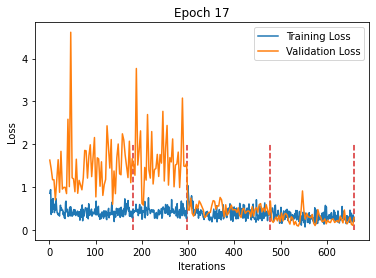

Train



Sequence:1, Seq Training Mean Loss: 0.4091690383023686, Seq Training Acc: 0.8197916666666667
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2816353041264746, Seq Training Acc: 0.5196180555555555
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.38507575856314763, Seq Training Acc: 0.8258680555555555
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.29787871378163494, Seq Training Acc: 0.8680555555555556
******************************************************************
Epoch:18, Epoch Training Loss Mean: 0.3758002817630768, Epoch Acc: 1.011111111111111
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.1194230342904727, Seq Val Acc: 0.690625



******************************************************************
Sequence:2, Seq Mean Loss: 1.8262357543676326, Seq Val Acc: 0.6266025641025641



******************************************************************
Sequence:3, Seq Mean Loss: 0.7156718542178472, Seq Val Acc: 0.7203125



******************************************************************
Sequence:4, Seq Mean Loss: 0.37473500619331995, Seq Val Acc: 0.846875
Epoch:18, Epoch Val Mean Loss: 0.930652916431427, Epoch Val Acc: 0.8883680555555555
******************************************************************


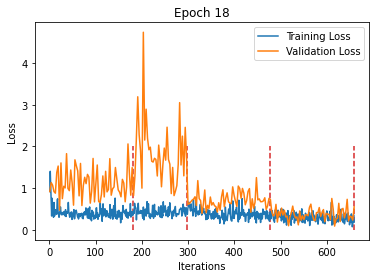

Train



Sequence:1, Seq Training Mean Loss: 0.40149075695210035, Seq Training Acc: 0.8171875
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.28626723314325014, Seq Training Acc: 0.5237847222222223
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.37586670021216073, Seq Training Acc: 0.8274305555555556
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.28945073791676096, Seq Training Acc: 0.8769097222222222
******************************************************************
Epoch:19, Epoch Training Loss Mean: 0.37014222145080566, Epoch Acc: 1.0151041666666667
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.2227792938550313, Seq Val Acc: 0.6671875



******************************************************************
Sequence:2, Seq Mean Loss: 1.72400485093777, Seq Val Acc: 0.6386217948717948



******************************************************************
Sequence:3, Seq Mean Loss: 0.42853545223673184, Seq Val Acc: 0.7989583333333333



******************************************************************
Sequence:4, Seq Mean Loss: 0.27822584472596645, Seq Val Acc: 0.890625
Epoch:19, Epoch Val Mean Loss: 0.8356558084487915, Epoch Val Acc: 0.9239583333333333
******************************************************************


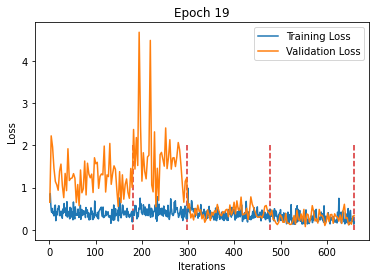

Train



Sequence:1, Seq Training Mean Loss: 0.4063767083817058, Seq Training Acc: 0.8223958333333333
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2711061668064859, Seq Training Acc: 0.5296875
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3737203584776984, Seq Training Acc: 0.8234375
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2882385647131337, Seq Training Acc: 0.8723958333333334
******************************************************************
Epoch:20, Epoch Training Loss Mean: 0.3664126694202423, Epoch Acc: 1.0159722222222223
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.0948685516913732, Seq Val Acc: 0.6994791666666667



******************************************************************
Sequence:2, Seq Mean Loss: 1.2669606384558556, Seq Val Acc: 0.6754807692307693



******************************************************************
Sequence:3, Seq Mean Loss: 0.5018734996517499, Seq Val Acc: 0.7682291666666666



******************************************************************
Sequence:4, Seq Mean Loss: 0.25574224156637987, Seq Val Acc: 0.8932291666666666
Epoch:20, Epoch Val Mean Loss: 0.7331530451774597, Epoch Val Acc: 0.9333333333333333
******************************************************************


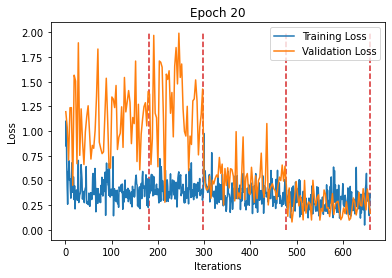

Train



Sequence:1, Seq Training Mean Loss: 0.3833879949318038, Seq Training Acc: 0.8265625
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2795868640972508, Seq Training Acc: 0.5262152777777778
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.36010557032293744, Seq Training Acc: 0.8348958333333333
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.27753661804729035, Seq Training Acc: 0.8793402777777778
******************************************************************
Epoch:21, Epoch Training Loss Mean: 0.3557918965816498, Epoch Acc: 1.022337962962963
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.2898399854699771, Seq Val Acc: 0.6921875



******************************************************************
Sequence:2, Seq Mean Loss: 1.6473012474867015, Seq Val Acc: 0.6610576923076923



******************************************************************
Sequence:3, Seq Mean Loss: 0.5325962141156196, Seq Val Acc: 0.7630208333333334



******************************************************************
Sequence:4, Seq Mean Loss: 0.3019314890106519, Seq Val Acc: 0.8875
Epoch:21, Epoch Val Mean Loss: 0.8753736019134521, Epoch Val Acc: 0.9241319444444445
******************************************************************


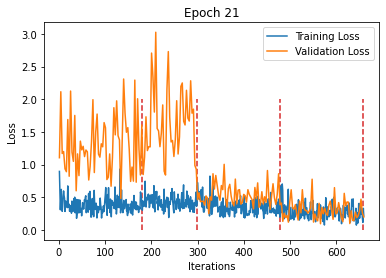

Train



Sequence:1, Seq Training Mean Loss: 0.38637297277649246, Seq Training Acc: 0.8302083333333333
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.27593341941634814, Seq Training Acc: 0.5269097222222222
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.37849654166234864, Seq Training Acc: 0.8279513888888889
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.29303281667331854, Seq Training Acc: 0.8720486111111111
******************************************************************
Epoch:22, Epoch Training Loss Mean: 0.3648790717124939, Epoch Acc: 1.019039351851852
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.4026860465606055, Seq Val Acc: 0.68125



******************************************************************
Sequence:2, Seq Mean Loss: 1.2738046050071716, Seq Val Acc: 0.6931089743589743



******************************************************************
Sequence:3, Seq Mean Loss: 0.3955958798527718, Seq Val Acc: 0.8213541666666667



******************************************************************
Sequence:4, Seq Mean Loss: 0.28487591706216336, Seq Val Acc: 0.8828125
Epoch:22, Epoch Val Mean Loss: 0.797569990158081, Epoch Val Acc: 0.9453125
******************************************************************


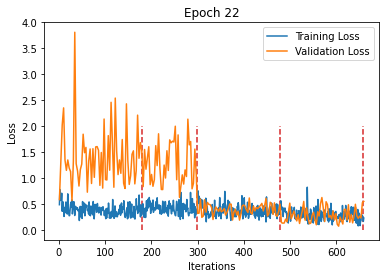

Train



Sequence:1, Seq Training Mean Loss: 0.42876001571615535, Seq Training Acc: 0.8114583333333333
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2801429914103614, Seq Training Acc: 0.5260416666666666
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.373277470552259, Seq Training Acc: 0.8286458333333333
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.3003524973988533, Seq Training Acc: 0.8664930555555556
******************************************************************
Epoch:23, Epoch Training Loss Mean: 0.3782005310058594, Epoch Acc: 1.0108796296296296
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.169435159365336, Seq Val Acc: 0.6838541666666667



******************************************************************
Sequence:2, Seq Mean Loss: 1.4892608171854265, Seq Val Acc: 0.6642628205128205



******************************************************************
Sequence:3, Seq Mean Loss: 0.6121486887335778, Seq Val Acc: 0.7395833333333334



******************************************************************
Sequence:4, Seq Mean Loss: 0.26090104766190053, Seq Val Acc: 0.8869791666666667
Epoch:23, Epoch Val Mean Loss: 0.8247957229614258, Epoch Val Acc: 0.9140625
******************************************************************


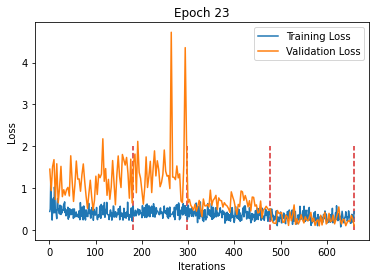

Train



Sequence:1, Seq Training Mean Loss: 0.3748413323528237, Seq Training Acc: 0.8338541666666667
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.26874986787637073, Seq Training Acc: 0.5302083333333333
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3605126784907447, Seq Training Acc: 0.8354166666666667
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.29118312170936, Seq Training Acc: 0.8725694444444444
******************************************************************
Epoch:24, Epoch Training Loss Mean: 0.3543338477611542, Epoch Acc: 1.0240162037037037
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.3513312473893166, Seq Val Acc: 0.6760416666666667



******************************************************************
Sequence:2, Seq Mean Loss: 1.8676493198443682, Seq Val Acc: 0.6225961538461539



******************************************************************
Sequence:3, Seq Mean Loss: 0.3935298296312491, Seq Val Acc: 0.815625



******************************************************************
Sequence:4, Seq Mean Loss: 0.3454913685719172, Seq Val Acc: 0.8546875
Epoch:24, Epoch Val Mean Loss: 0.9052943587303162, Epoch Val Acc: 0.9170138888888889
******************************************************************


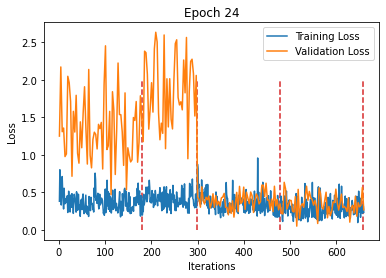

Train



Sequence:1, Seq Training Mean Loss: 0.37843209372626413, Seq Training Acc: 0.8342013888888888
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2702702263163196, Seq Training Acc: 0.5317708333333333
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3589634684224923, Seq Training Acc: 0.8357638888888889
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2684728851748837, Seq Training Acc: 0.8831597222222223
******************************************************************
Epoch:25, Epoch Training Loss Mean: 0.3490956723690033, Epoch Acc: 1.0282986111111112
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.0888113846381506, Seq Val Acc: 0.703125



******************************************************************
Sequence:2, Seq Mean Loss: 1.4722621333904755, Seq Val Acc: 0.6602564102564102



******************************************************************
Sequence:3, Seq Mean Loss: 0.432110025237004, Seq Val Acc: 0.7979166666666667



******************************************************************
Sequence:4, Seq Mean Loss: 0.2460853318994244, Seq Val Acc: 0.9010416666666666
Epoch:25, Epoch Val Mean Loss: 0.7462950944900513, Epoch Val Acc: 0.94375
******************************************************************


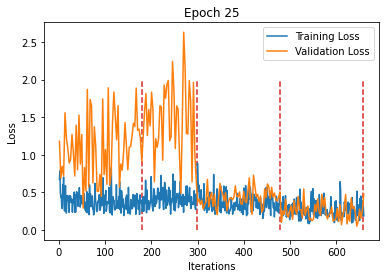

Train



Sequence:1, Seq Training Mean Loss: 0.3710692143274678, Seq Training Acc: 0.8407986111111111
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.26765086907479496, Seq Training Acc: 0.5329861111111112
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.356534789254268, Seq Training Acc: 0.8435763888888889
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2692010619574123, Seq Training Acc: 0.8852430555555556
******************************************************************
Epoch:26, Epoch Training Loss Mean: 0.345899760723114, Epoch Acc: 1.0342013888888888
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.9021997630596161, Seq Val Acc: 0.7203125



******************************************************************
Sequence:2, Seq Mean Loss: 1.3514450712081714, Seq Val Acc: 0.6658653846153846



******************************************************************
Sequence:3, Seq Mean Loss: 0.6324987813830376, Seq Val Acc: 0.7322916666666667



******************************************************************
Sequence:4, Seq Mean Loss: 0.2678978230804205, Seq Val Acc: 0.8911458333333333
Epoch:26, Epoch Val Mean Loss: 0.7345303297042847, Epoch Val Acc: 0.9255208333333333
******************************************************************


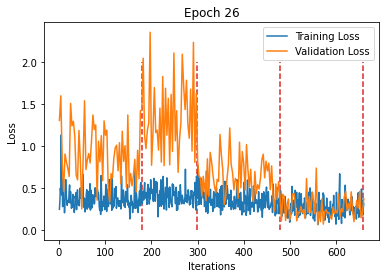

Train



Sequence:1, Seq Training Mean Loss: 0.3825481894115607, Seq Training Acc: 0.8321180555555555
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.26124653451972535, Seq Training Acc: 0.5307291666666667
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3357771087851789, Seq Training Acc: 0.8494791666666667
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.272813056781888, Seq Training Acc: 0.8791666666666667
******************************************************************
Epoch:27, Epoch Training Loss Mean: 0.34259769320487976, Epoch Acc: 1.0304976851851853
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.8317770332098007, Seq Val Acc: 0.7416666666666667



******************************************************************
Sequence:2, Seq Mean Loss: 1.3129718899726868, Seq Val Acc: 0.6802884615384616



******************************************************************
Sequence:3, Seq Mean Loss: 0.4485450302561124, Seq Val Acc: 0.7916666666666666



******************************************************************
Sequence:4, Seq Mean Loss: 0.294955231808126, Seq Val Acc: 0.8817708333333333
Epoch:27, Epoch Val Mean Loss: 0.6653996706008911, Epoch Val Acc: 0.9524305555555556
******************************************************************


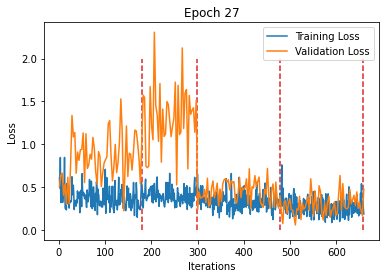

Train



Sequence:1, Seq Training Mean Loss: 0.356848870880074, Seq Training Acc: 0.8380208333333333
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2554080840614107, Seq Training Acc: 0.5383680555555556
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.33656848834620584, Seq Training Acc: 0.8515625
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2763056534859869, Seq Training Acc: 0.8803819444444444
******************************************************************
Epoch:28, Epoch Training Loss Mean: 0.33514225482940674, Epoch Acc: 1.0361111111111112
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 1.078880672653516, Seq Val Acc: 0.7083333333333334



******************************************************************
Sequence:2, Seq Mean Loss: 1.335780843710288, Seq Val Acc: 0.6722756410256411



******************************************************************
Sequence:3, Seq Mean Loss: 0.37497909665107726, Seq Val Acc: 0.8390625



******************************************************************
Sequence:4, Seq Mean Loss: 0.27584364550809065, Seq Val Acc: 0.8869791666666667
Epoch:28, Epoch Val Mean Loss: 0.7117701172828674, Epoch Val Acc: 0.9571180555555555
******************************************************************


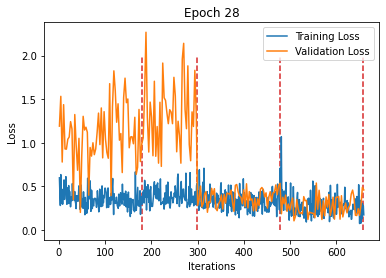

Train



Sequence:1, Seq Training Mean Loss: 0.3708668242726061, Seq Training Acc: 0.8395833333333333
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2573113349576791, Seq Training Acc: 0.534375
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.32339269005590016, Seq Training Acc: 0.8546875
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.25815251192284955, Seq Training Acc: 0.8880208333333334
******************************************************************
Epoch:29, Epoch Training Loss Mean: 0.3309273421764374, Epoch Acc: 1.038888888888889
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.9082629588743051, Seq Val Acc: 0.7192708333333333



******************************************************************
Sequence:2, Seq Mean Loss: 1.2497422786859365, Seq Val Acc: 0.6858974358974359



******************************************************************
Sequence:3, Seq Mean Loss: 0.31580464690923693, Seq Val Acc: 0.8583333333333333



******************************************************************
Sequence:4, Seq Mean Loss: 0.24524497613310814, Seq Val Acc: 0.8927083333333333
Epoch:29, Epoch Val Mean Loss: 0.6251083016395569, Epoch Val Acc: 0.9720486111111111
******************************************************************


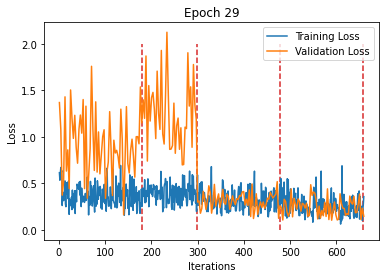

Train



Sequence:1, Seq Training Mean Loss: 0.3483382126523389, Seq Training Acc: 0.8456597222222222
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.25226875088281103, Seq Training Acc: 0.5357638888888889
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3262288169728385, Seq Training Acc: 0.8557291666666667
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.27239057425823476, Seq Training Acc: 0.8795138888888889
******************************************************************
Epoch:30, Epoch Training Loss Mean: 0.32805585861206055, Epoch Acc: 1.038888888888889
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.7774196401238441, Seq Val Acc: 0.7401041666666667



******************************************************************
Sequence:2, Seq Mean Loss: 1.0011397791214478, Seq Val Acc: 0.7099358974358975



******************************************************************
Sequence:3, Seq Mean Loss: 0.4450731952985128, Seq Val Acc: 0.7916666666666666



******************************************************************
Sequence:4, Seq Mean Loss: 0.27738310520847637, Seq Val Acc: 0.8864583333333333
Epoch:30, Epoch Val Mean Loss: 0.5892101526260376, Epoch Val Acc: 0.9598958333333333
******************************************************************


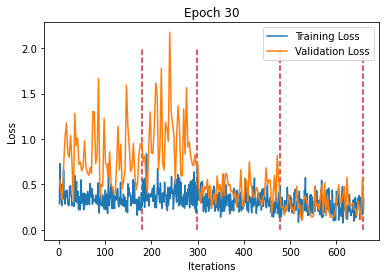

Train



Sequence:1, Seq Training Mean Loss: 0.3365423017905818, Seq Training Acc: 0.8553819444444445
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2475852706366115, Seq Training Acc: 0.5451388888888888
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.30653269543415973, Seq Training Acc: 0.865625
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2549365599743194, Seq Training Acc: 0.8916666666666667
******************************************************************
Epoch:31, Epoch Training Loss Mean: 0.31338515877723694, Epoch Acc: 1.0526041666666666
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.7820689226190249, Seq Val Acc: 0.7489583333333333



******************************************************************
Sequence:2, Seq Mean Loss: 1.1830090467746441, Seq Val Acc: 0.6931089743589743



******************************************************************
Sequence:3, Seq Mean Loss: 0.4063196241855621, Seq Val Acc: 0.8317708333333333



******************************************************************
Sequence:4, Seq Mean Loss: 0.2591584146022797, Seq Val Acc: 0.8958333333333334
Epoch:31, Epoch Val Mean Loss: 0.607261061668396, Epoch Val Acc: 0.9756944444444444
******************************************************************


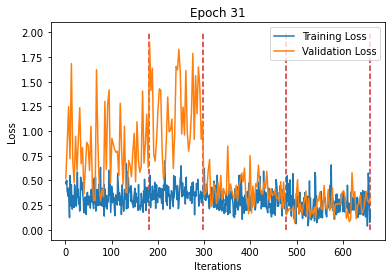

Train



Sequence:1, Seq Training Mean Loss: 0.352270165251361, Seq Training Acc: 0.8404513888888889
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2534913242691093, Seq Training Acc: 0.5368055555555555
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.31478811709417237, Seq Training Acc: 0.8557291666666667
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2505794956866238, Seq Training Acc: 0.8890625
******************************************************************
Epoch:32, Epoch Training Loss Mean: 0.320369690656662, Epoch Acc: 1.0406828703703703
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.7980480775237083, Seq Val Acc: 0.7385416666666667



******************************************************************
Sequence:2, Seq Mean Loss: 1.1139102486463694, Seq Val Acc: 0.7107371794871795



******************************************************************
Sequence:3, Seq Mean Loss: 0.359224862853686, Seq Val Acc: 0.84375



******************************************************************
Sequence:4, Seq Mean Loss: 0.26118027394016585, Seq Val Acc: 0.8869791666666667
Epoch:32, Epoch Val Mean Loss: 0.5869849324226379, Epoch Val Acc: 0.9770833333333333
******************************************************************


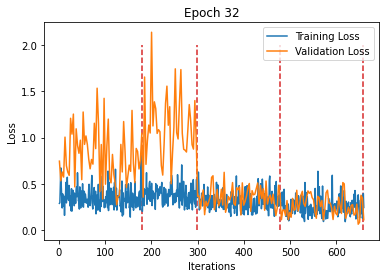

Train



Sequence:1, Seq Training Mean Loss: 0.3526150943918361, Seq Training Acc: 0.8409722222222222
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2539116993546486, Seq Training Acc: 0.5345486111111111
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3012589661611451, Seq Training Acc: 0.8644097222222222
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.25581169741021265, Seq Training Acc: 0.8892361111111111
******************************************************************
Epoch:33, Epoch Training Loss Mean: 0.31830933690071106, Epoch Acc: 1.0430555555555556
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.7654158552487691, Seq Val Acc: 0.7447916666666666



******************************************************************
Sequence:2, Seq Mean Loss: 1.0892330201772542, Seq Val Acc: 0.6955128205128205



******************************************************************
Sequence:3, Seq Mean Loss: 0.3842892058193684, Seq Val Acc: 0.8286458333333333



******************************************************************
Sequence:4, Seq Mean Loss: 0.23881029275556406, Seq Val Acc: 0.8973958333333333
Epoch:33, Epoch Val Mean Loss: 0.5743881464004517, Epoch Val Acc: 0.9743055555555555
******************************************************************


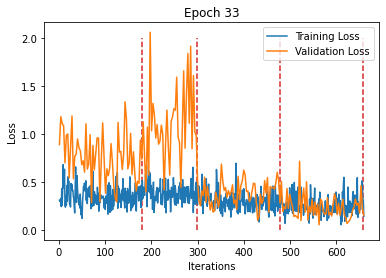

Train



Sequence:1, Seq Training Mean Loss: 0.34134806415273083, Seq Training Acc: 0.8522569444444444
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.24642298312650787, Seq Training Acc: 0.5420138888888889
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3107672324611081, Seq Training Acc: 0.8586805555555556
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.26350444946438073, Seq Training Acc: 0.8836805555555556
******************************************************************
Epoch:34, Epoch Training Loss Mean: 0.31788402795791626, Epoch Acc: 1.0455439814814815
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.7489175468683242, Seq Val Acc: 0.7447916666666666



******************************************************************
Sequence:2, Seq Mean Loss: 1.050237434032636, Seq Val Acc: 0.6947115384615384



******************************************************************
Sequence:3, Seq Mean Loss: 0.3981652135650317, Seq Val Acc: 0.8130208333333333



******************************************************************
Sequence:4, Seq Mean Loss: 0.2664348028600216, Seq Val Acc: 0.8838541666666667
Epoch:34, Epoch Val Mean Loss: 0.5742936730384827, Epoch Val Acc: 0.9644097222222222
******************************************************************


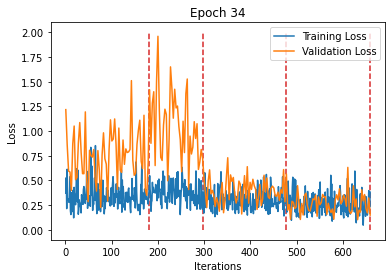

Train



Sequence:1, Seq Training Mean Loss: 0.3343981999489996, Seq Training Acc: 0.8515625
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2395727030105061, Seq Training Acc: 0.5456597222222223
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3036243641128143, Seq Training Acc: 0.8642361111111111
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.25005453812579315, Seq Training Acc: 0.8904513888888889
******************************************************************
Epoch:35, Epoch Training Loss Mean: 0.3084756135940552, Epoch Acc: 1.0506365740740742
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.7808431153496106, Seq Val Acc: 0.753125



******************************************************************
Sequence:2, Seq Mean Loss: 1.0372956334016261, Seq Val Acc: 0.7131410256410257



******************************************************************
Sequence:3, Seq Mean Loss: 0.34260412653287253, Seq Val Acc: 0.8385416666666666



******************************************************************
Sequence:4, Seq Mean Loss: 0.24476807471364737, Seq Val Acc: 0.8989583333333333
Epoch:35, Epoch Val Mean Loss: 0.5595774054527283, Epoch Val Acc: 0.9847222222222223
******************************************************************


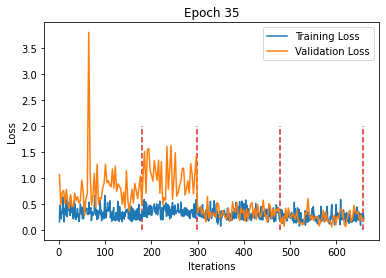

Train



Sequence:1, Seq Training Mean Loss: 0.3396724448435836, Seq Training Acc: 0.8519097222222223
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.24420154988765716, Seq Training Acc: 0.5434027777777778
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.304796816698379, Seq Training Acc: 0.8621527777777778
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.25302193909883497, Seq Training Acc: 0.8907986111111111
******************************************************************
Epoch:36, Epoch Training Loss Mean: 0.3123171627521515, Epoch Acc: 1.0494212962962963
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6981069939831893, Seq Val Acc: 0.7619791666666667



******************************************************************
Sequence:2, Seq Mean Loss: 0.8042209392938858, Seq Val Acc: 0.7483974358974359



******************************************************************
Sequence:3, Seq Mean Loss: 0.41465560098489124, Seq Val Acc: 0.8322916666666667



******************************************************************
Sequence:4, Seq Mean Loss: 0.29664103003839654, Seq Val Acc: 0.8755208333333333
Epoch:36, Epoch Val Mean Loss: 0.5293554067611694, Epoch Val Acc: 0.9854166666666667
******************************************************************


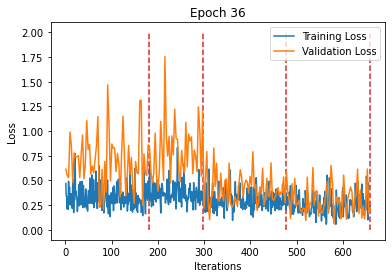

Train



Sequence:1, Seq Training Mean Loss: 0.3271601756413778, Seq Training Acc: 0.8595486111111111
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.24894641348057323, Seq Training Acc: 0.5404513888888889
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.2922697347899278, Seq Training Acc: 0.8736111111111111
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.24933177038199372, Seq Training Acc: 0.8920138888888889
******************************************************************
Epoch:37, Epoch Training Loss Mean: 0.30575600266456604, Epoch Acc: 1.0552083333333333
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.7879577944676082, Seq Val Acc: 0.7505208333333333



******************************************************************
Sequence:2, Seq Mean Loss: 0.9032234167441343, Seq Val Acc: 0.7235576923076923



******************************************************************
Sequence:3, Seq Mean Loss: 0.331264728307724, Seq Val Acc: 0.85625



******************************************************************
Sequence:4, Seq Mean Loss: 0.24200356702009837, Seq Val Acc: 0.9015625
Epoch:37, Epoch Val Mean Loss: 0.5337866544723511, Epoch Val Acc: 0.9928819444444444
******************************************************************


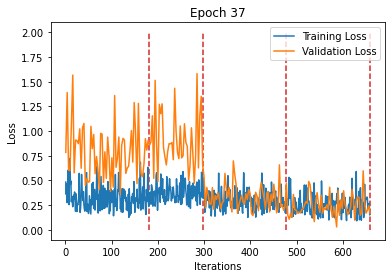

Train



Sequence:1, Seq Training Mean Loss: 0.3190913220246633, Seq Training Acc: 0.8576388888888888
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.23771791400180922, Seq Training Acc: 0.546875
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.295425504570206, Seq Training Acc: 0.8704861111111111
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.23352152469257514, Seq Training Acc: 0.8946180555555555
******************************************************************
Epoch:38, Epoch Training Loss Mean: 0.29701539874076843, Epoch Acc: 1.0565393518518518
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6171741644541423, Seq Val Acc: 0.7828125



******************************************************************
Sequence:2, Seq Mean Loss: 0.9997329925879453, Seq Val Acc: 0.7267628205128205



******************************************************************
Sequence:3, Seq Mean Loss: 0.3625741146504879, Seq Val Acc: 0.8369791666666667



******************************************************************
Sequence:4, Seq Mean Loss: 0.2077990912521879, Seq Val Acc: 0.9052083333333333
Epoch:38, Epoch Val Mean Loss: 0.5033900737762451, Epoch Val Acc: 0.9991319444444444
******************************************************************


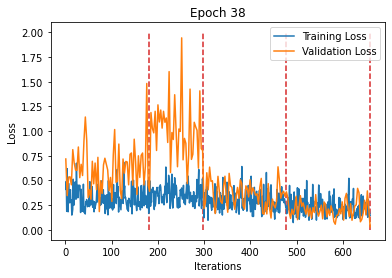

Train



Sequence:1, Seq Training Mean Loss: 0.34078518661359947, Seq Training Acc: 0.8465277777777778
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2272163886990812, Seq Training Acc: 0.5555555555555556
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.27701704969836605, Seq Training Acc: 0.8765625
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.22469130290879144, Seq Training Acc: 0.9046875
******************************************************************
Epoch:39, Epoch Training Loss Mean: 0.2926258146762848, Epoch Acc: 1.0611111111111111
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6851539688805739, Seq Val Acc: 0.7765625



******************************************************************
Sequence:2, Seq Mean Loss: 0.8375122707623702, Seq Val Acc: 0.7363782051282052



******************************************************************
Sequence:3, Seq Mean Loss: 0.38767658099532126, Seq Val Acc: 0.84375



******************************************************************
Sequence:4, Seq Mean Loss: 0.215277517773211, Seq Val Acc: 0.90625
Epoch:39, Epoch Val Mean Loss: 0.502052366733551, Epoch Val Acc: 1.0017361111111112
******************************************************************


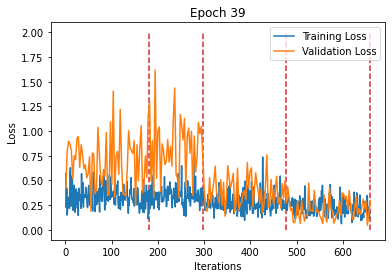

Train



Sequence:1, Seq Training Mean Loss: 0.316628061938617, Seq Training Acc: 0.8642361111111111
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2357884992327955, Seq Training Acc: 0.5446180555555555
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.26893453838096726, Seq Training Acc: 0.8826388888888889
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.23912000865158106, Seq Training Acc: 0.8947916666666667
******************************************************************
Epoch:40, Epoch Training Loss Mean: 0.29009848833084106, Epoch Acc: 1.0620949074074073
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6168068272372087, Seq Val Acc: 0.7953125



******************************************************************
Sequence:2, Seq Mean Loss: 0.9256085463059254, Seq Val Acc: 0.7331730769230769



******************************************************************
Sequence:3, Seq Mean Loss: 0.34246649853885175, Seq Val Acc: 0.8609375



******************************************************************
Sequence:4, Seq Mean Loss: 0.24443841837346553, Seq Val Acc: 0.9026041666666667
Epoch:40, Epoch Val Mean Loss: 0.4946184456348419, Epoch Val Acc: 1.0118055555555556
******************************************************************


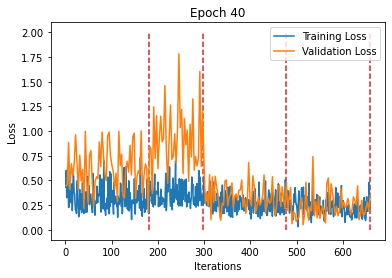

Train



Sequence:1, Seq Training Mean Loss: 0.34140173387196326, Seq Training Acc: 0.8465277777777778
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.23901015809840626, Seq Training Acc: 0.5461805555555556
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.27726042792201044, Seq Training Acc: 0.8732638888888888
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.23582528568804265, Seq Training Acc: 0.903125
******************************************************************
Epoch:41, Epoch Training Loss Mean: 0.2991330921649933, Epoch Acc: 1.0563657407407407
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5946949653327465, Seq Val Acc: 0.7880208333333333



******************************************************************
Sequence:2, Seq Mean Loss: 0.9646178957743522, Seq Val Acc: 0.7163461538461539



******************************************************************
Sequence:3, Seq Mean Loss: 0.3401901848614216, Seq Val Acc: 0.8473958333333333



******************************************************************
Sequence:4, Seq Mean Loss: 0.2234823852777481, Seq Val Acc: 0.9015625
Epoch:41, Epoch Val Mean Loss: 0.48914220929145813, Epoch Val Acc: 1.0008680555555556
******************************************************************


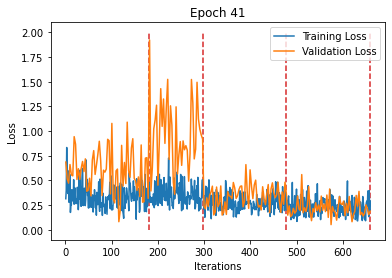

Train



Sequence:1, Seq Training Mean Loss: 0.3017971940338612, Seq Training Acc: 0.8710069444444445
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.23159466534852982, Seq Training Acc: 0.5472222222222223
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.2759445110128986, Seq Training Acc: 0.8770833333333333
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.23524146531191137, Seq Training Acc: 0.8961805555555555
******************************************************************
Epoch:42, Epoch Training Loss Mean: 0.28575077652931213, Epoch Acc: 1.0638310185185185
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6583216761549314, Seq Val Acc: 0.7734375



******************************************************************
Sequence:2, Seq Mean Loss: 0.8890914007639273, Seq Val Acc: 0.7387820512820513



******************************************************************
Sequence:3, Seq Mean Loss: 0.321325376133124, Seq Val Acc: 0.85



******************************************************************
Sequence:4, Seq Mean Loss: 0.2604779588679473, Seq Val Acc: 0.8895833333333333
Epoch:42, Epoch Val Mean Loss: 0.49809160828590393, Epoch Val Acc: 0.9977430555555555
******************************************************************


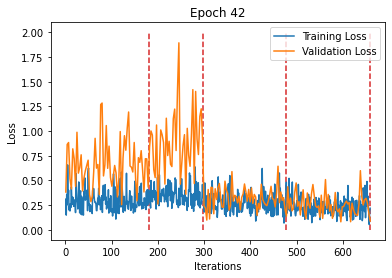

Train



Sequence:1, Seq Training Mean Loss: 0.3058212483094798, Seq Training Acc: 0.8715277777777778
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.21865396565861173, Seq Training Acc: 0.5559027777777777
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.2807373388773865, Seq Training Acc: 0.8779513888888889
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2276091262905134, Seq Training Acc: 0.9026041666666667
******************************************************************
Epoch:43, Epoch Training Loss Mean: 0.28253480792045593, Epoch Acc: 1.0693287037037038
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5116925073166688, Seq Val Acc: 0.8151041666666666



******************************************************************
Sequence:2, Seq Mean Loss: 0.8180220837776477, Seq Val Acc: 0.7379807692307693



******************************************************************
Sequence:3, Seq Mean Loss: 0.33660444567600883, Seq Val Acc: 0.8578125



******************************************************************
Sequence:4, Seq Mean Loss: 0.29545499086380006, Seq Val Acc: 0.8682291666666667
Epoch:43, Epoch Val Mean Loss: 0.459031879901886, Epoch Val Acc: 1.0069444444444444
******************************************************************


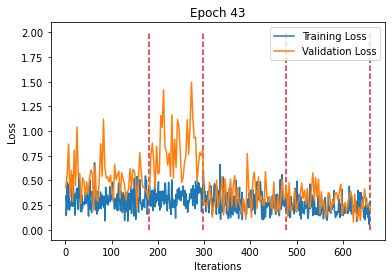

Train



Sequence:1, Seq Training Mean Loss: 0.31066310712032846, Seq Training Acc: 0.8673611111111111
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2229001746409469, Seq Training Acc: 0.5526041666666667
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.26294375513162876, Seq Training Acc: 0.8829861111111111
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.22765557391362057, Seq Training Acc: 0.9029513888888889
******************************************************************
Epoch:44, Epoch Training Loss Mean: 0.28016605973243713, Epoch Acc: 1.0686342592592593
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5180517320831617, Seq Val Acc: 0.7947916666666667



******************************************************************
Sequence:2, Seq Mean Loss: 0.8469061255455017, Seq Val Acc: 0.7516025641025641



******************************************************************
Sequence:3, Seq Mean Loss: 0.32443140347798666, Seq Val Acc: 0.8567708333333334



******************************************************************
Sequence:4, Seq Mean Loss: 0.2580375578875343, Seq Val Acc: 0.8890625
Epoch:44, Epoch Val Mean Loss: 0.45233142375946045, Epoch Val Acc: 1.0097222222222222
******************************************************************


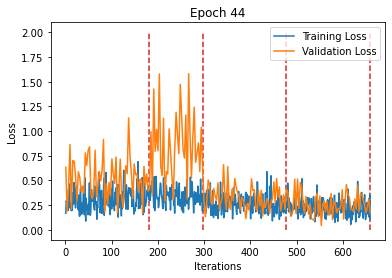

Train



Sequence:1, Seq Training Mean Loss: 0.3140200573951006, Seq Training Acc: 0.8649305555555555
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.22580395340919496, Seq Training Acc: 0.5541666666666667
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.2844589318252272, Seq Training Acc: 0.8744791666666667
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.23392910357150767, Seq Training Acc: 0.8970486111111111
******************************************************************
Epoch:45, Epoch Training Loss Mean: 0.2894805073738098, Epoch Acc: 1.0635416666666666
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5360431954264641, Seq Val Acc: 0.8052083333333333



******************************************************************
Sequence:2, Seq Mean Loss: 0.8745626497727174, Seq Val Acc: 0.7347756410256411



******************************************************************
Sequence:3, Seq Mean Loss: 0.3410209946334362, Seq Val Acc: 0.8510416666666667



******************************************************************
Sequence:4, Seq Mean Loss: 0.21776749168833096, Seq Val Acc: 0.9052083333333333
Epoch:45, Epoch Val Mean Loss: 0.4556979238986969, Epoch Val Acc: 1.0130208333333333
******************************************************************


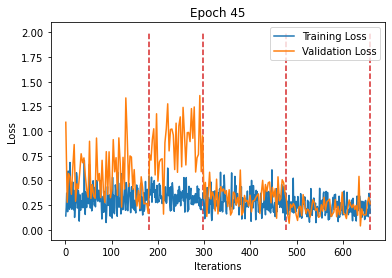

Train



Sequence:1, Seq Training Mean Loss: 0.3216952358269029, Seq Training Acc: 0.8565972222222222
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.23857773459619946, Seq Training Acc: 0.5489583333333333
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.2606786185668574, Seq Training Acc: 0.8845486111111112
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.22988323472026323, Seq Training Acc: 0.9001736111111112
******************************************************************
Epoch:46, Epoch Training Loss Mean: 0.28746241331100464, Epoch Acc: 1.063425925925926
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.4871887731055419, Seq Val Acc: 0.8104166666666667



******************************************************************
Sequence:2, Seq Mean Loss: 0.8433123735281137, Seq Val Acc: 0.7387820512820513



******************************************************************
Sequence:3, Seq Mean Loss: 0.3295812419305245, Seq Val Acc: 0.8567708333333334



******************************************************************
Sequence:4, Seq Mean Loss: 0.23371248990297316, Seq Val Acc: 0.9005208333333333
Epoch:46, Epoch Val Mean Loss: 0.43798235058784485, Epoch Val Acc: 1.0159722222222223
******************************************************************


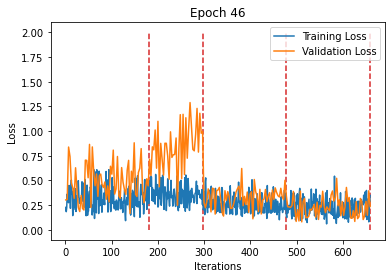

Train



Sequence:1, Seq Training Mean Loss: 0.3133262221597963, Seq Training Acc: 0.8621527777777778
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.22294209947188695, Seq Training Acc: 0.5541666666666667
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.257562422255675, Seq Training Acc: 0.8829861111111111
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.23109856297572454, Seq Training Acc: 0.8986111111111111
******************************************************************
Epoch:47, Epoch Training Loss Mean: 0.28037580847740173, Epoch Acc: 1.0659722222222223
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5364720990260442, Seq Val Acc: 0.8020833333333334



******************************************************************
Sequence:2, Seq Mean Loss: 0.7802085975805918, Seq Val Acc: 0.7403846153846154



******************************************************************
Sequence:3, Seq Mean Loss: 0.3044333559771379, Seq Val Acc: 0.8692708333333333



******************************************************************
Sequence:4, Seq Mean Loss: 0.2231328681111336, Seq Val Acc: 0.9
Epoch:47, Epoch Val Mean Loss: 0.43045860528945923, Epoch Val Acc: 1.0175347222222222
******************************************************************


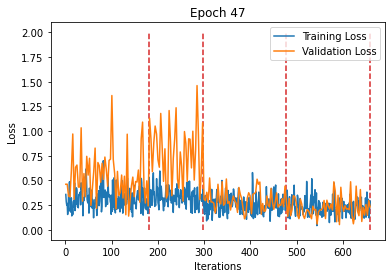

Train



Sequence:1, Seq Training Mean Loss: 0.32049836334255005, Seq Training Acc: 0.8611111111111112
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2247995875775814, Seq Training Acc: 0.5524305555555555
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.266910171839926, Seq Training Acc: 0.8857638888888889
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2370565061767896, Seq Training Acc: 0.8982638888888889
******************************************************************
Epoch:48, Epoch Training Loss Mean: 0.2870328724384308, Epoch Acc: 1.0658564814814815
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.4836659708370765, Seq Val Acc: 0.8197916666666667



******************************************************************
Sequence:2, Seq Mean Loss: 0.9437829019167484, Seq Val Acc: 0.7099358974358975



******************************************************************
Sequence:3, Seq Mean Loss: 0.2979845973352591, Seq Val Acc: 0.8645833333333334



******************************************************************
Sequence:4, Seq Mean Loss: 0.22862672035892803, Seq Val Acc: 0.9067708333333333
Epoch:48, Epoch Val Mean Loss: 0.44485923647880554, Epoch Val Acc: 1.0175347222222222
******************************************************************


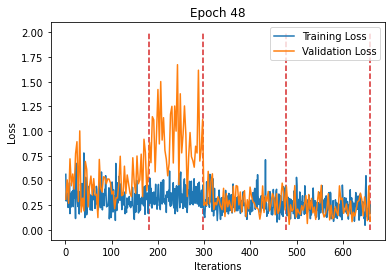

Train



Sequence:1, Seq Training Mean Loss: 0.30445431909627385, Seq Training Acc: 0.8664930555555556
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.21955645233392715, Seq Training Acc: 0.5586805555555555
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.26810362078249456, Seq Training Acc: 0.8821180555555556
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.22705739829689264, Seq Training Acc: 0.9024305555555555
******************************************************************
Epoch:49, Epoch Training Loss Mean: 0.2788008153438568, Epoch Acc: 1.0699074074074073
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5274841176966826, Seq Val Acc: 0.7989583333333333



******************************************************************
Sequence:2, Seq Mean Loss: 0.8134787587019113, Seq Val Acc: 0.7371794871794872



******************************************************************
Sequence:3, Seq Mean Loss: 0.3590998525420825, Seq Val Acc: 0.84375



******************************************************************
Sequence:4, Seq Mean Loss: 0.25766018182039263, Seq Val Acc: 0.8786458333333333
Epoch:49, Epoch Val Mean Loss: 0.458357572555542, Epoch Val Acc: 1.000173611111111
******************************************************************


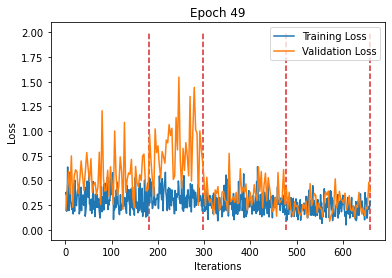

Train



Sequence:1, Seq Training Mean Loss: 0.31408447420431507, Seq Training Acc: 0.8640625
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.22872331167260807, Seq Training Acc: 0.5486111111111112
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.2743480568130811, Seq Training Acc: 0.8739583333333333
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2386817262818416, Seq Training Acc: 0.8951388888888889
******************************************************************
Epoch:50, Epoch Training Loss Mean: 0.28883096575737, Epoch Acc: 1.0605902777777778
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5484007967015108, Seq Val Acc: 0.7994791666666666



******************************************************************
Sequence:2, Seq Mean Loss: 0.7866713989239472, Seq Val Acc: 0.7620192307692307



******************************************************************
Sequence:3, Seq Mean Loss: 0.32440100486079854, Seq Val Acc: 0.8640625



******************************************************************
Sequence:4, Seq Mean Loss: 0.24521614275872708, Seq Val Acc: 0.8885416666666667
Epoch:50, Epoch Val Mean Loss: 0.44639846682548523, Epoch Val Acc: 1.015798611111111
******************************************************************


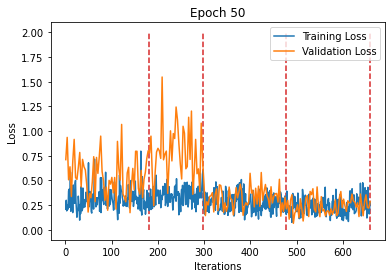


Save Model


TypeError: forward() takes 3 positional arguments but 4 were given

In [27]:
if run_train:
    #writer = SummaryWriter('runs/Regenerated_Type2_Dataset_Experiment_lr' + str(lr) + '_' + timestampStr)
    writer = SummaryWriter('runs/008_Experiment_1stripe_lr' + str(lr) + '_' + timestampStr)
    max_iter_per_seq = 180
    # 训练迭代总步数
    num_train_iter_per_epoch = 0
    num_train_iterations = [] # For plot parting line
    for seq_dataloaders in dataloaders:
        if len(seq_dataloaders[train_dl_idx]) <= max_iter_per_seq:
            num_train_iter_per_epoch += len(seq_dataloaders[train_dl_idx])
        else:
            num_train_iter_per_epoch += max_iter_per_seq
        num_train_iterations.append(num_train_iter_per_epoch)
    print("Total Train Iterations: ",num_train_iter_per_epoch)
    print("Total Train Iterations List: ",num_train_iterations)
        
    # 训练迭代总步数为验证迭代总步数的3倍
    num_val_iterations = [int(number / 3) for number in num_train_iterations]
    num_val_iter_per_epoch = num_val_iterations[-1]
    
    # iterations in every seq
    num_val_iter_per_seq = []
    num_val_iter_per_seq.append(num_val_iterations[0])
    for i in range(len(num_val_iterations)-1):
        diff = num_val_iterations[i+1] - num_val_iterations[i] # The latter minus the former
        num_val_iter_per_seq.append(diff)
        
    print(num_val_iter_per_seq)
        
    optimizer = torch.optim.Adam(model.parameters(),lr=lr,eps=1e-08)

    scheduler = OneCycleLR(optimizer, num_train_iter_per_epoch, num_epochs, min_lr_factor=min_lr_factor)
    scheduler.step(epoch=0)
    
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.
    loss_min = 0.
    
    for epoch in tqdm(range(1,num_epochs+1)):

        print('Train')

        model.train()
        
        running_corrects = 0

        train_loss_array = np.zeros(num_train_iter_per_epoch, dtype=np.single)

        # mse_y = torch.zeros(batch_sizes[0]//2).to(device)
        
        i = 0
        seq_idx = 1
        for (refs, train_dl) in zip(refs_list,train_dls):
            # obtain the refs in every seq
            
            curr_train_dl = train_dl

            curr_refs = refs.float().to(device)

            # Training
            dl_iter = iter(curr_train_dl)
            
            # This two only used to compute the loss and acc in every Sequence
            running_loss = 0
            corrects = 0
            for idx in tqdm(range(len(curr_train_dl))):
                if idx >= max_iter_per_seq:
                    break
                try:
                    img1, img2, targets = next(dl_iter)

                except (StopIteration, TypeError):
                    dl_iter = iter(curr_train_dl)
                    img1, img2, targets = next(dl_iter)
                
                scheduler.zero_grad()

                img1 = img1.float().to(device)
                img2 = img2.float().to(device)
                targets = targets.view(-1)
                targets = targets.float().to(device)

                # forward pass
                loss, preds = model.compute_loss(img1, img2, curr_refs, targets)
                
                loss.backward()
                
                running_loss += loss.item()
                corrects += torch.sum(preds == targets)
                running_corrects += torch.sum(preds == targets)

                train_loss_array[i] = loss.cpu().detach().numpy()
               
                
                # record loss and accuracy per iteration
                c = torch.sum(preds == targets)
                acc = int(c) / img1.size(0)
                writer.add_scalar('Train/Loss per Iteration',train_loss_array[i], ((epoch - 1) * num_train_iter_per_epoch)+ i)
                writer.add_scalar('Train/Acc per Iteration',acc, ((epoch - 1) * num_train_iter_per_epoch)+ i)
                
                # Record the lr
                curr_lr = get_lr(optimizer)
                writer.add_scalar('Train/Learning Rate',curr_lr , ((epoch - 1) * num_train_iter_per_epoch)+ i)
                
                i += 1
                scheduler.step()
            
            # record loss and accuracy in every train dataloader (namely every Sequence)
            #seq_train_mean_loss = running_loss / len(curr_train_dl)
            #seq_train_acc = int(corrects) / (len(curr_train_dl) * img1.size(0))
            seq_train_mean_loss = running_loss / max_iter_per_seq
            seq_train_acc = int(corrects) / (max_iter_per_seq * img1.size(0))
            
            print("Sequence:{}, Seq Training Mean Loss: {}, Seq Training Acc: {}".format(seq_idx, seq_train_mean_loss, seq_train_acc))
            print("******************************************************************")
            # Record the loss and acc in every Seq in Tensorboard
            writer.add_scalar('Train/Seq Training Mean Loss',seq_train_mean_loss, (epoch - 1) * len(train_dls) + seq_idx)
            writer.add_scalar('Train/Seq Training Accuracy', seq_train_acc, (epoch - 1) * len(train_dls) + seq_idx)
            writer.add_scalar('Train/Seq Error Rate',1 - seq_train_acc, (epoch - 1) * len(train_dls) + seq_idx)
            
            seq_idx += 1
            
        # after one epoch update scheduler   
        # Plot lr policy
        curr_lr = get_lr(optimizer)
        writer.add_scalar('Train/Learning Rate Policy',curr_lr , epoch)
        writer.flush()
            
        # record loss and accuracy in every epoch (namely 6 Sequences)
        epoch_train_mean_loss = train_loss_array.mean()  # std
        epoch_train_acc = int(running_corrects) / (max_iter_per_seq* 3 * img1.size(0))

        print("Epoch:{}, Epoch Training Loss Mean: {}, Epoch Acc: {}".format(epoch, epoch_train_mean_loss, epoch_train_acc))
        print("******************************************************************")
        
        ### Validation
        print('Validation')
        model.eval()
        val_loss_array = np.zeros(num_val_iter_per_epoch, dtype=np.single)
        
        running_corrects = 0

        i = 0
        with torch.no_grad():
            seq_idx = 1
            for (refs, valid_dl, max_num) in zip(refs_list,valid_dls, num_val_iter_per_seq):
                
                curr_valid_dl = valid_dl
                curr_refs = refs.float().to(device)
                iter_max_num = max_num
            
                dl_iter = iter(curr_valid_dl)
                # This two uesd to compute loss and accurary in every Seq
                running_loss = 0
                corrects = 0
                for dl_idx in tqdm(range(iter_max_num)):
                    try:
                        img1, img2, targets = next(dl_iter)
                    except (StopIteration, TypeError):
                        dl_iter = iter(curr_valid_dl)
                        img1, img2, targets = next(dl_iter)
                    
                    scheduler.zero_grad()

                    img1 = img1.float().to(device)
                    img2 = img2.float().to(device)
                    targets = targets.view(-1)
                    targets = targets.float().to(device)
                
                    loss, preds = model.compute_loss(img1, img2, curr_refs, targets)
                    
                    running_loss += loss.item()
                    corrects += torch.sum(preds == targets)
                    running_corrects += torch.sum(preds == targets)
                    
                    # record loss and accuracy in every iteration
                    c = torch.sum(preds == targets)
                    acc = int(c) / img1.size(0)
                    writer.add_scalar('Validation/Loss per Iteration',loss.item(), ((epoch - 1) * num_val_iter_per_epoch)+ i)
                    writer.add_scalar('Validation/Acc per Iteration',acc, ((epoch - 1) * num_val_iter_per_epoch)+ i)

                    val_loss_array[i] = loss.cpu().detach().numpy()
                    i += 1
            
                #seq_val_mean_loss = running_loss / len(curr_valid_dl)
                #seq_val_acc = int(corrects) / (len(curr_valid_dl) * img1.size(0))
                seq_val_mean_loss = running_loss / iter_max_num
                seq_val_acc = int(corrects) / (iter_max_num * img1.size(0))
                print("******************************************************************")
                print("Sequence:{}, Seq Mean Loss: {}, Seq Val Acc: {}".format(seq_idx,seq_val_mean_loss, seq_val_acc))
                
                writer.add_scalar('Validation/Seq Mean Loss',seq_val_mean_loss, (epoch - 1) * len(valid_dls) + seq_idx)
                writer.add_scalar('Validation/Seq Accuracy', seq_val_acc, (epoch - 1) * len(valid_dls) + seq_idx)
                writer.add_scalar('Validation/Seq Error Rate',1 - seq_val_acc, (epoch - 1) * len(valid_dls) + seq_idx)
                
                seq_idx += 1
                
            epoch_val_mean_loss = val_loss_array.mean()  # std
            epoch_val_acc = int(running_corrects) / (iter_max_num*3 * img1.size(0))

            print("Epoch:{}, Epoch Val Mean Loss: {}, Epoch Val Acc: {}".format(epoch, epoch_val_mean_loss, epoch_val_acc))
            print("******************************************************************")
            
        # save best model weights
        if epoch_val_acc > best_acc:
            best_model_wts = copy.deepcopy(model.state_dict())
            loss_min = epoch_val_mean_loss
            
        # Tensorboard
        writer.add_scalars('Epoch/Loss', {"Training Loss": epoch_train_mean_loss,
                                          "Validation Loss": epoch_val_mean_loss}, epoch)
        writer.add_scalars('Epoch/Accuracy', {"Training Accuracy":epoch_train_acc,
                                              "Validation Accuracy": epoch_val_acc}, epoch)
        writer.add_scalars('Epoch/Error Rate', {"Training": 1 - epoch_train_acc,
                                                "Validation": 1 - epoch_val_acc}, epoch)
        writer.flush()
        
        plt.plot(np.linspace(1, train_loss_array.size+1, train_loss_array.size), train_loss_array,label='Training Loss')
        plt.plot(np.linspace(1, train_loss_array.size+1, val_loss_array.size), val_loss_array, label='Validation Loss')
        
        train_parting_line = num_train_iterations  # 1128 iterations in total in training
        val_parting_line = num_val_iterations  # 373 iterations in total in validation
        plt.vlines(train_parting_line, 0, 2, colors = "tab:red", linestyles = "dashed")
        #plt.vlines(val_parting_line, 0, 2, colors = "tab:orange", linestyles = "dashed")
        
        plt.title('Epoch {}'.format(epoch))
        plt.xlabel('Iterations')
        plt.ylabel('Loss')
        plt.legend(loc='upper right')
        plt.show()
        
    print("Save Model")
    torch.save(model, net_path + '/m-' + timestampStr)
    torch.save({'epoch': epoch, 
                'state_dict': best_model_wts, 
                'best_loss': loss_min,
                'optimizer': optimizer.state_dict()},
                net_path + '/m-' + timestampStr + '-' + str("%.4f" % loss_min) + '.pth.tar')
    # add model to tensorboard
    writer.add_graph(model,(img1, curr_refs, targets))
    writer.flush()

    print('Finished Training')
        

### Valid Config

In [28]:
batch_size = 32
valid_dl_idx = 1
num_test_iter_per_epoch = 0
for seq_dataloaders in dataloaders:
    num_test_iter_per_epoch += len(seq_dataloaders[valid_dl_idx])
    
model.eval()
y_vect = np.zeros(batch_size * num_test_iter_per_epoch)
y_tilde_vect = np.zeros(batch_size * num_test_iter_per_epoch)

i = 0
with torch.no_grad():
    seq_idx = 1
    
    running_corrects = 0

    test_loss_array = np.zeros(num_test_iter_per_epoch, dtype=np.single)
    
    for (refs, test_dl) in zip(refs_list,valid_dls):
        
        curr_test_dl = test_dl
        
        curr_refs = refs.float().to(device) 

        dl_iter = iter(curr_test_dl)
        
        # This two uesd to compute loss and accurary in every Seq
        running_loss = 0
        corrects = 0

        for dl_idx in tqdm(range(len(curr_test_dl))):
            try:
                img1, img2, targets = next(dl_iter)
            except (StopIteration, TypeError):
                dl_iter = iter(curr_valid_dl)
                img1, img2, targets = next(dl_iter)

            scheduler.zero_grad()
            img1 = img1.float().to(device)
            img2 = img2.float().to(device)
            targets = targets.view(-1)
            targets = targets.float().to(device)
              
            loss, preds = model.compute_loss(img1, img2, curr_refs, targets)
                    
            running_loss += loss.item()
            corrects += torch.sum(preds == targets)
            
            test_loss_array[i] = loss.cpu().detach().numpy()

            y_vect[i*batch_size:(i+1)*batch_size] = targets.detach().cpu().numpy()
            y_tilde_vect[i*batch_size:(i+1)*batch_size] = preds.detach().cpu().numpy()
            
            # record loss and accuracy per iteration
            c = torch.sum(preds == targets)
            acc = int(c) / img1.size(0)
            
            writer.add_scalar('Test/Loss per Iteration',test_loss_array[i], i)
            writer.add_scalar('Test/Acc per Iteration',acc, i)
            writer.add_scalar('Test/Error Rate', 1 - acc, i)

            i += 1
        # record seq test loss and acc
        seq_test_mean_loss = running_loss / len(curr_test_dl)
        seq_test_acc = int(corrects) / (len(curr_test_dl) * img1.size(0))
        
        print("******************************************************************")
        print("Test: Sequence:{}, Seq Mean Loss: {}, Seq Acc: {}".format(seq_idx,seq_test_mean_loss, seq_test_acc))
            
        writer.add_scalar('Test/Seq Loss', seq_test_mean_loss, seq_idx)
        writer.add_scalar('Test/Seq Accuracy', seq_test_acc, seq_idx)
        writer.add_scalar('Test/Seq Error Rate', 1 - seq_test_acc, seq_idx)
        
        seq_idx += 1

writer.close()
                                      
print("Test finished")


******************************************************************
Test: Sequence:1, Seq Mean Loss: 0.5147384239868684, Seq Acc: 0.8090909090909091



******************************************************************
Test: Sequence:2, Seq Mean Loss: 0.8122525965345317, Seq Acc: 0.7349137931034483



******************************************************************
Test: Sequence:3, Seq Mean Loss: 0.31387235462031465, Seq Acc: 0.8656914893617021



******************************************************************
Test: Sequence:4, Seq Mean Loss: 0.2717606990921254, Seq Acc: 0.8762755102040817
Test finished


### Init test dataset for plotting degradation metrics 

In [29]:
def init_test_dataset(path,seq_idx_list,mean_val,std_val):

    ds_h5 = []
    refs_list = []

    img_transforms = [RandomRotateGrayscale(rot_range=[-0.1, 0.1], fill=150),
                      RandomFlip(lr_prob=0.5, ud_prob=0.5),
                      transforms.ToTensor(),
                      transforms.Normalize((mean_val,),(std_val,))]
    
    composed_img_transforms = transforms.Compose(img_transforms)
    
    # to obtain the Seq data
    for seq_idx in seq_idx_list:
        h5_fpath = path.format(seq_idx)
        h5_f = DatasetH5ForTest(h5_fpath,normalize_im=False, transform = composed_img_transforms)
        
        # obtain the references, the first 10 images in every Seq.
        refs = h5_f.getRef()
        refs_list.append(refs)
        
        ds_h5.append(h5_f)

    return refs_list, ds_h5

In [36]:
data_path_type2 = "../MA/NewData/21503_1000200411_653340003"
fnames_type2 = "regenerated_roi_ms1_seq{}_720x30.h5" # 2,3,5,6
combined_path_type2 = os.path.join(data_path_type2, fnames_type2)
seq_idx_list_type2 = [1,2,3,5,6]

inputs_shape = [1,720,30]
mean_val = 0
std_val = 255

refs_list, ds_h5_test = init_test_dataset(combined_path_type2,seq_idx_list_type2,mean_val,std_val)

In [37]:
ds_h5_test

Init Dataloader for degradation value

In [38]:
batch_size = 1
test_dataloaders = []
for ds in ds_h5_test: 
    test_dataloader = DataLoader(dataset = ds, batch_size=batch_size, shuffle = False)
    test_dataloaders.append(test_dataloader)

### Degradation metrics function

In [39]:
def degradation_metrics(v1, refs_tensor):
    r"""Calculate distance between vector of img1&img2 and each reference images
    Args:
        v1 (Tensor, torch.Size[batchsize,128]): batch of imgs from feature extractor
        
        refs_vectors(List of Tensor, torch.Size([1,128])): List of 10 refs vectors
    """
    v_dim = v1.size(1) # 128
    num_ref = refs_tensor.size(0)

    v11 = v1.unsqueeze(1).repeat(1, num_ref, 1)
    refs = refs_tensor.unsqueeze(0).repeat(v1.size(0), 1, 1)  #v1.size(0) = batch size
    
    kernel_matrix1 = (v11-refs).pow(2).sum(2) 
    
    metric = torch.mean(kernel_matrix1,dim = 1) 

    return metric

In [40]:
all_seq_y_tilde_vect = np.zeros(0)
time_ids = []

for refs,dl in zip(refs_list, test_dataloaders):

    curr_refs = refs.float().to(device)
    num_data = len(dl)
    print(num_data)
    
    loss_vect = np.zeros(num_data)
    var_res_vect= np.zeros(num_data)

    y_vect = np.zeros(num_data)
    y_tilde_vect = np.zeros(num_data)
    
    dl_iter = iter(dl)

    for i in tqdm(range(num_data)):
        try:
            img,label = next(dl_iter)

        except (StopIteration, TypeError):
            dl_iter = iter(curr_train_dl)
            img,label = next(dl_iter)
            
        y_vect[i] = label
        
        img = img.float().to(device)
                
        #targets = targets.float().to(device)
        
        #v1, refs_v = model.forward_test(img, curr_refs)
        #metric = degradation_metrics(v1,refs_v)
        
        metric = model.forward(img, curr_refs)
        
        y_tilde = metric.detach().cpu().numpy()

        var_res_vect[i] = np.var(y_tilde)

        y_tilde_vect[i] = y_tilde.mean()

        loss_vect[i] = np.abs(label - y_tilde_vect[i])
        
    time_ids.append(y_tilde_vect.size)
        
    all_seq_y_tilde_vect = np.concatenate((all_seq_y_tilde_vect, y_tilde_vect))

15279



8880



4769



7690



7980


<IPython.core.display.Javascript object>


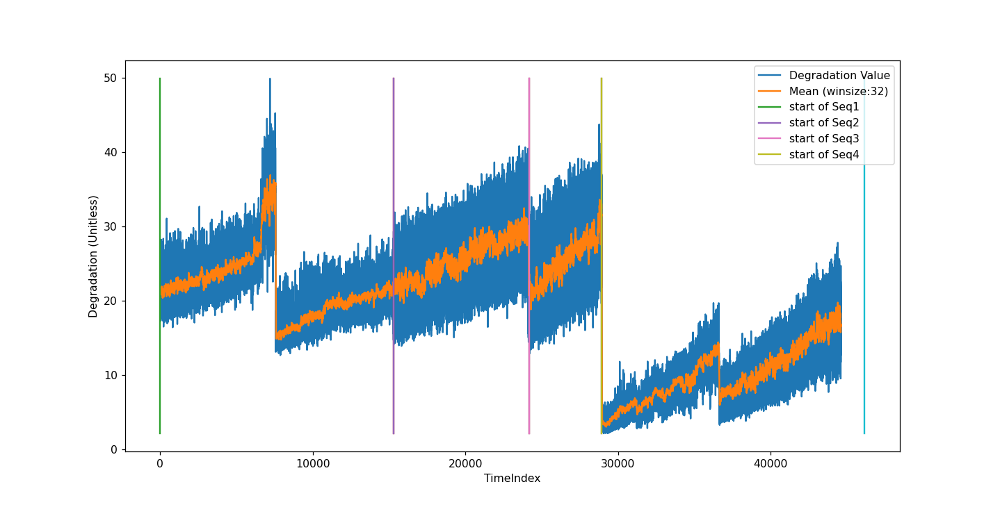

In [41]:
%matplotlib notebook
plt.plot(all_seq_y_tilde_vect, label='Degradation Value')
plt.plot(pd.Series(all_seq_y_tilde_vect).rolling(32).mean(), label='Mean (winsize:32)')

min_y = all_seq_y_tilde_vect.min()
max_y = all_seq_y_tilde_vect.max()

#curr_x_pos = 0
#for i in range(1, len(im_ds_h5)):
#    print(len(im_ds_h5[i]))
#    curr_x_pos += len(im_ds_h5[i])
#    plt.plot([curr_x_pos, curr_x_pos], [min_y, max_y])
'''
# Type 1 Data
seq_period_iloc = [
    [    0,  6412],
    [ 6412, 11193],
    [ 11193, 15990],
    [ 15990, 21321],
]
'''
# Type 2 , 1 stripe Data
seq_period_iloc = [
    [    0,  15279],
    [ 15279, 24159],
    [ 24159, 28928],
    [ 28928, 46149],
]


seq_index = 1
for stime_iloc, etime_iloc in seq_period_iloc:
    plt.plot([stime_iloc, stime_iloc], [min_y, max_y], label = "start of Seq{}".format(seq_index))
    plt.plot([etime_iloc, etime_iloc], [min_y, max_y])
    seq_index += 1


plt.ylabel("Degradation (Unitless)")
plt.xlabel("TimeIndex")

plt.legend()
plt.show()

In [43]:
import plotly.graph_objects as go

fig = go.Figure()

plot_raw_pts = True
    
fig.add_trace(
    go.Scatter(
        x=np.arange(all_seq_y_tilde_vect.size),
        y=all_seq_y_tilde_vect,
        mode='lines',
        #mode='lines+markers',
    )
)

fig.add_trace(
    go.Scatter(
        x=np.arange(all_seq_y_tilde_vect.size),
        y=pd.Series(all_seq_y_tilde_vect).rolling(32).mean(),
        mode='lines',
        #mode='lines+markers',
    )
)

In [44]:
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
# Create traces
trace0 = go.Scatter(
            x=np.arange(all_seq_y_tilde_vect.size),
            y=all_seq_y_tilde_vect,
            mode='lines',
            #mode='lines+markers',
            )

trace1 = go.Scatter(
            x=np.arange(all_seq_y_tilde_vect.size),
            y=pd.Series(all_seq_y_tilde_vect).rolling(32).mean(),
            mode='lines',
            #mode='lines+markers',
            )

# Fill out data with our traces
data = [trace0, trace1]
# Plot it and save as basic-line.html
pyo.iplot(data, filename = 'basic-line')

# Finde Outliers

In [ ]:
all_seq_y_tilde_vect.size

In [ ]:
y=pd.Series(all_seq_y_tilde_vect).rolling(32).mean()
y_firstpart = pd.Series(all_seq_y_tilde_vect[:32]).rolling(32).mean()

In [ ]:
y_firstpart_mean = y_firstpart[31]
y_firstpart_mean

In [ ]:
y[:31] = y_firstpart_mean

In [ ]:
res = all_seq_y_tilde_vect - y

In [ ]:
res[0]

In [ ]:
fig = go.Figure()

fig = go.Figure()

plot_raw_pts = True
    
fig.add_trace(
    go.Scatter(
        x=np.arange(all_seq_y_tilde_vect.size),
        y=res,
        mode='lines',
        #mode='lines+markers',
    )
)

In [ ]:
outliers = np.where(abs(res) > 2.5, True, res)

In [ ]:
index = np.argwhere(outliers == True)

In [ ]:
index